In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ColabNotebooks/DAUP/Project/wfp_food_prices_ind.csv')
df.head()

,date,admin1,admin2,market,latitude,longitude,category,commodity,unit,priceflag,pricetype,currency,price,usdprice
0,15-01-1994,Delhi,Delhi,Delhi,28.666667,77.216667,cereals and tubers,Rice,KG,actual,Retail,INR,8.0,0.2550
1,15-01-1994,Delhi,Delhi,Delhi,28.666667,77.216667,cereals and tubers,Wheat,KG,actual,Retail,INR,5.0,0.1594
2,15-01-1994,Delhi,Delhi,Delhi,28.666667,77.216667,miscellaneous food,Sugar,KG,actual,Retail,INR,13.5,0.4303
3,15-01-1994,Delhi,Delhi,Delhi,28.666667,77.216667,oil and fats,Oil (mustard),KG,actual,Retail,INR,31.0,0.9880
4,15-01-1994,Gujarat,Ahmadabad,Ahmedabad,23.033333,72.616667,cereals and tubers,Rice,KG,actual,Retail,INR,6.8,0.2167


In [ ]:
df["date"] = pd.to_datetime(df["date"], errors="coerce")
df.info()

<ipython-input-4-1b24e32a5611>:1: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df["date"] = pd.to_datetime(df["date"], errors="coerce")


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165450 entries, 0 to 165449
Data columns (total 14 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   date       165450 non-null  datetime64[ns]
 1   admin1     164869 non-null  object        
 2   admin2     164869 non-null  object        
 3   market     165450 non-null  object        
 4   latitude   164869 non-null  float64       
 5   longitude  164869 non-null  float64       
 6   category   165450 non-null  object        
 7   commodity  165450 non-null  object        
 8   unit       165450 non-null  object        
 9   priceflag  165450 non-null  object        
 10  pricetype  165450 non-null  object        
 11  currency   165450 non-null  object        
 12  price      165450 non-null  float64       
 13  usdprice   165450 non-null  float64       
dtypes: datetime64[ns](1), float64(4), object(9)
memory usage: 17.7+ MB


In [ ]:
df.describe()

,date
count,165450
mean,2018-07-24 23:38:39.535811584
min,1994-01-15 00:00:00
25%,2016-02-15 00:00:00
50%,2020-06-15 00:00:00
75%,2022-03-15 00:00:00
max,2024-12-15 00:00:00


In [ ]:
df.head()

,date,admin1,admin2,market,latitude,longitude,category,commodity,unit,priceflag,pricetype,currency,price,usdprice
0,1994-01-15,Delhi,Delhi,Delhi,28.666667,77.216667,cereals and tubers,Rice,KG,actual,Retail,INR,8.0,0.2550
1,1994-01-15,Delhi,Delhi,Delhi,28.666667,77.216667,cereals and tubers,Wheat,KG,actual,Retail,INR,5.0,0.1594
2,1994-01-15,Delhi,Delhi,Delhi,28.666667,77.216667,miscellaneous food,Sugar,KG,actual,Retail,INR,13.5,0.4303
3,1994-01-15,Delhi,Delhi,Delhi,28.666667,77.216667,oil and fats,Oil (mustard),KG,actual,Retail,INR,31.0,0.9880
4,1994-01-15,Gujarat,Ahmadabad,Ahmedabad,23.033333,72.616667,cereals and tubers,Rice,KG,actual,Retail,INR,6.8,0.2167


In [ ]:
df.shape

(165450, 14)

In [ ]:
print(df.isnull().sum())

date           0
admin1       581
admin2       581
market         0
latitude     581
longitude    581
category       0
commodity      0
unit           0
priceflag      0
pricetype      0
currency       0
price          0
usdprice       0
dtype: int64


In [ ]:
df_cleaned = df.dropna().copy()
df_cleaned['latitude'] = pd.to_numeric(df_cleaned['latitude'], errors='coerce')
df_cleaned['longitude'] = pd.to_numeric(df_cleaned['longitude'], errors='coerce')
df_cleaned['price'] = pd.to_numeric(df_cleaned['price'], errors='coerce')
df_cleaned['usdprice'] = pd.to_numeric(df_cleaned['usdprice'], errors='coerce')

In [ ]:
print(df_cleaned.isnull().sum())

date         0
admin1       0
admin2       0
market       0
latitude     0
longitude    0
category     0
commodity    0
unit         0
priceflag    0
pricetype    0
currency     0
price        0
usdprice     0
dtype: int64


In [ ]:
df_cleaned.shape

(164869, 14)

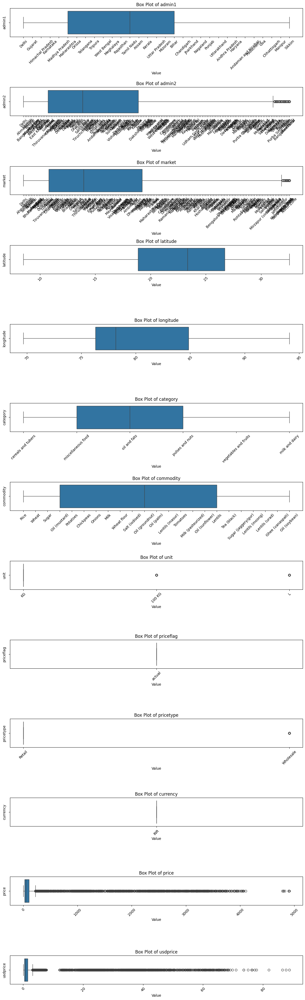

In [ ]:
df_cleaned = df_cleaned.dropna(subset=['latitude', 'longitude', 'price', 'usdprice'])
features = ['admin1', 'admin2', 'market', 'latitude', 'longitude', 'category', 'commodity',
            'unit', 'priceflag', 'pricetype', 'currency', 'price', 'usdprice']
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(12, len(features) * 3))
for ax, feature in zip(axes, features):
    sns.boxplot(x=df_cleaned[feature], ax=ax)
    ax.set_title(f'Box Plot of {feature}')
    ax.set_xlabel('Value')
    ax.set_ylabel(feature)
    ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
def remove_outliers(df):
    df_numeric = df.select_dtypes(include=[np.number])
    Q1 = df_numeric.quantile(0.25)
    Q3 = df_numeric.quantile(0.75)
    IQR = Q3 - Q1
    mask = ~((df_numeric < (Q1 - 1.5 * IQR)) | (df_numeric > (Q3 + 1.5 * IQR))).any(axis=1)
    return df.loc[mask]

In [ ]:
df_clean = remove_outliers(df_cleaned)
print(f"Original Cleaned dataset size: {df_cleaned.shape}")
print(f"Dataset size after outlier removal: {df_clean.shape}")
print(f"Number of rows removed: {df_cleaned.shape[0] - df_clean.shape[0]}")

Original Cleaned dataset size: (164869, 14)
Dataset size after outlier removal: (158159, 14)
Number of rows removed: 6710


In [ ]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 158159 entries, 0 to 165449
Data columns (total 14 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   date       158159 non-null  datetime64[ns]
 1   admin1     158159 non-null  object        
 2   admin2     158159 non-null  object        
 3   market     158159 non-null  object        
 4   latitude   158159 non-null  float64       
 5   longitude  158159 non-null  float64       
 6   category   158159 non-null  object        
 7   commodity  158159 non-null  object        
 8   unit       158159 non-null  object        
 9   priceflag  158159 non-null  object        
 10  pricetype  158159 non-null  object        
 11  currency   158159 non-null  object        
 12  price      158159 non-null  float64       
 13  usdprice   158159 non-null  float64       
dtypes: datetime64[ns](1), float64(4), object(9)
memory usage: 18.1+ MB


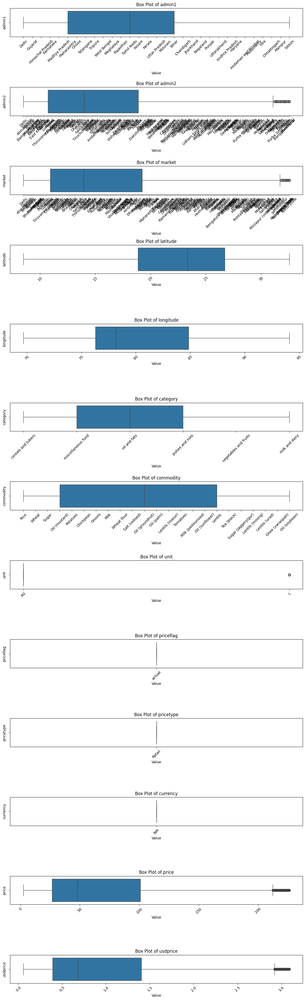

In [ ]:
features = ['admin1', 'admin2', 'market', 'latitude', 'longitude', 'category', 'commodity',
            'unit', 'priceflag', 'pricetype', 'currency', 'price', 'usdprice']
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(12, len(features) * 3))
for ax, feature in zip(axes, features):
    sns.boxplot(x=df_clean[feature], ax=ax)
    ax.set_title(f'Box Plot of {feature}')
    ax.set_xlabel('Value')
    ax.set_ylabel(feature)
    ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
df_cleans = remove_outliers(df_clean)
print(f"Original Cleaned dataset size: {df_clean.shape}")
print(f"Dataset size after outlier removal: {df_cleans.shape}")
print(f"Number of rows removed: {df_clean.shape[0] - df_cleans.shape[0]}")

Original Cleaned dataset size: (158159, 14)
Dataset size after outlier removal: (157094, 14)
Number of rows removed: 1065


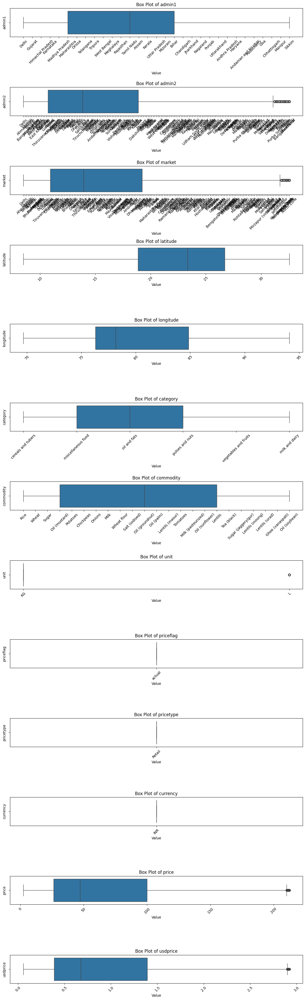

In [ ]:
features = ['admin1', 'admin2', 'market', 'latitude', 'longitude', 'category', 'commodity',
            'unit', 'priceflag', 'pricetype', 'currency', 'price', 'usdprice']
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(12, len(features) * 3))
for ax, feature in zip(axes, features):
    sns.boxplot(x=df_cleans[feature], ax=ax)
    ax.set_title(f'Box Plot of {feature}')
    ax.set_xlabel('Value')
    ax.set_ylabel(feature)
    ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
df_cleanss = remove_outliers(df_cleans)
print(f"Original Cleaned dataset size: {df_cleans.shape}")
print(f"Dataset size after outlier removal: {df_cleanss.shape}")
print(f"Number of rows removed: {df_cleans.shape[0] - df_cleanss.shape[0]}")

Original Cleaned dataset size: (157094, 14)
Dataset size after outlier removal: (156929, 14)
Number of rows removed: 165


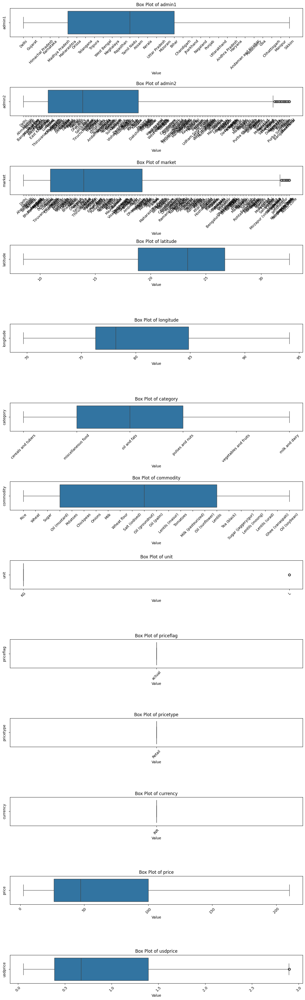

In [ ]:
features = ['admin1', 'admin2', 'market', 'latitude', 'longitude', 'category', 'commodity',
            'unit', 'priceflag', 'pricetype', 'currency', 'price', 'usdprice']
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(12, len(features) * 3))
for ax, feature in zip(axes, features):
    sns.boxplot(x=df_cleanss[feature], ax=ax)
    ax.set_title(f'Box Plot of {feature}')
    ax.set_xlabel('Value')
    ax.set_ylabel(feature)
    ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
df_cleansss = remove_outliers(df_cleanss)
print(f"Original Cleaned dataset size: {df_cleanss.shape}")
print(f"Dataset size after outlier removal: {df_cleansss.shape}")
print(f"Number of rows removed: {df_cleanss.shape[0] - df_cleansss.shape[0]}")

Original Cleaned dataset size: (156929, 14)
Dataset size after outlier removal: (156916, 14)
Number of rows removed: 13


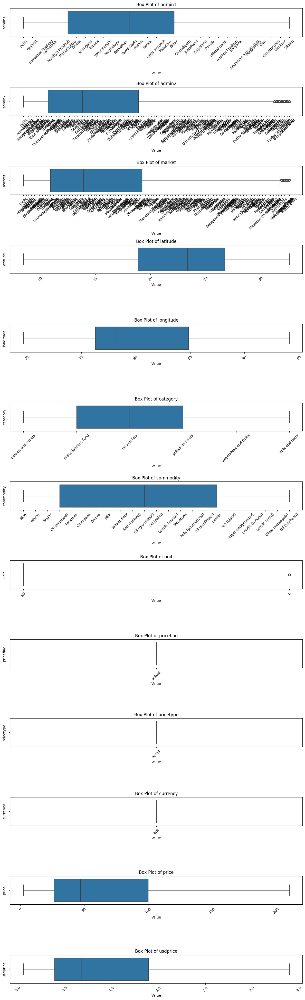

In [ ]:
features = ['admin1', 'admin2', 'market', 'latitude', 'longitude', 'category', 'commodity',
            'unit', 'priceflag', 'pricetype', 'currency', 'price', 'usdprice']
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(12, len(features) * 3))
for ax, feature in zip(axes, features):
    sns.boxplot(x=df_cleansss[feature], ax=ax)
    ax.set_title(f'Box Plot of {feature}')
    ax.set_xlabel('Value')
    ax.set_ylabel(feature)
    ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
df_cleanssss = remove_outliers(df_cleansss)
print(f"Original Cleaned dataset size: {df_cleansss.shape}")
print(f"Dataset size after outlier removal: {df_cleanssss.shape}")
print(f"Number of rows removed: {df_cleansss.shape[0] - df_cleanssss.shape[0]}")

Original Cleaned dataset size: (156916, 14)
Dataset size after outlier removal: (156916, 14)
Number of rows removed: 0


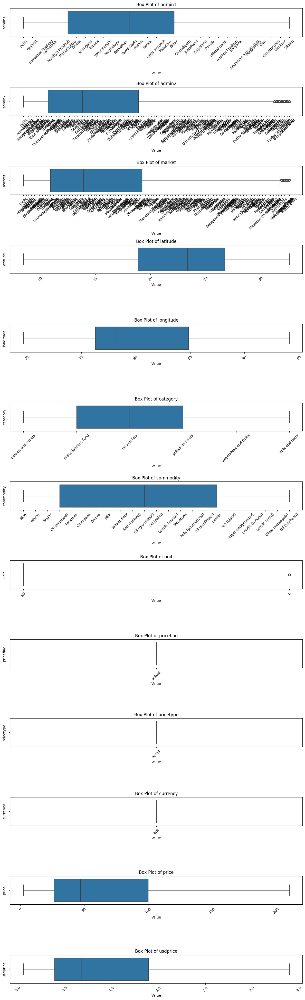

In [ ]:
features = ['admin1', 'admin2', 'market', 'latitude', 'longitude', 'category', 'commodity',
            'unit', 'priceflag', 'pricetype', 'currency', 'price', 'usdprice']
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(12, len(features) * 3))
for ax, feature in zip(axes, features):
    sns.boxplot(x=df_cleanssss[feature], ax=ax)
    ax.set_title(f'Box Plot of {feature}')
    ax.set_xlabel('Value')
    ax.set_ylabel(feature)
    ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

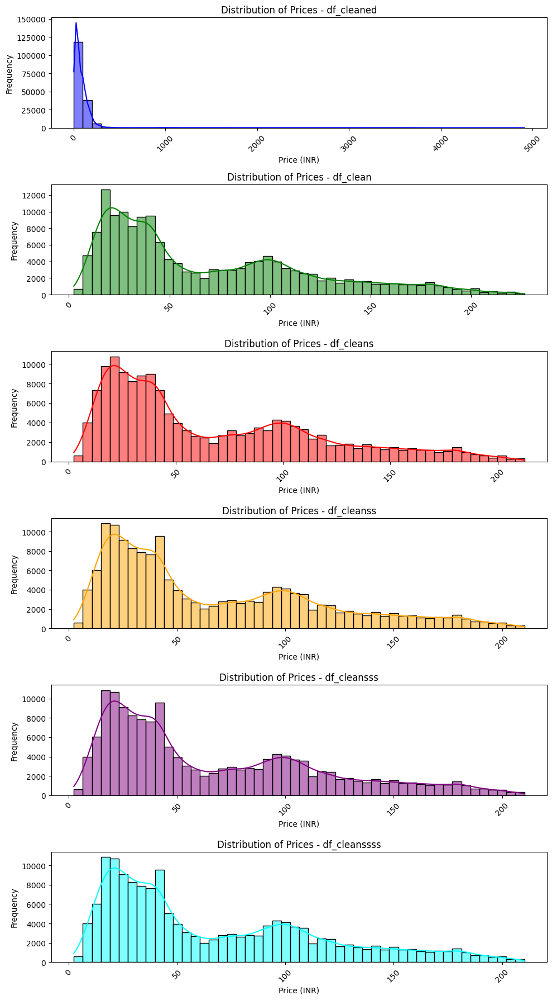

In [ ]:
dfs = [df_cleaned, df_clean, df_cleans, df_cleanss, df_cleansss, df_cleanssss]
df_names = ["df_cleaned", "df_clean", "df_cleans", "df_cleanss", "df_cleansss", "df_cleanssss"]
colors = ["blue", "green", "red", "orange", "purple", "cyan"]
fig, axes = plt.subplots(nrows=len(dfs), ncols=1, figsize=(10, len(dfs) * 3))
for ax, df, name, color in zip(axes, dfs, df_names, colors):
    sns.histplot(df["price"], bins=50, kde=True, ax=ax, color=color)
    ax.set_title(f"Distribution of Prices - {name}", fontsize=12)
    ax.set_xlabel("Price (INR)", fontsize=10)
    ax.set_ylabel("Frequency", fontsize=10)
    ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

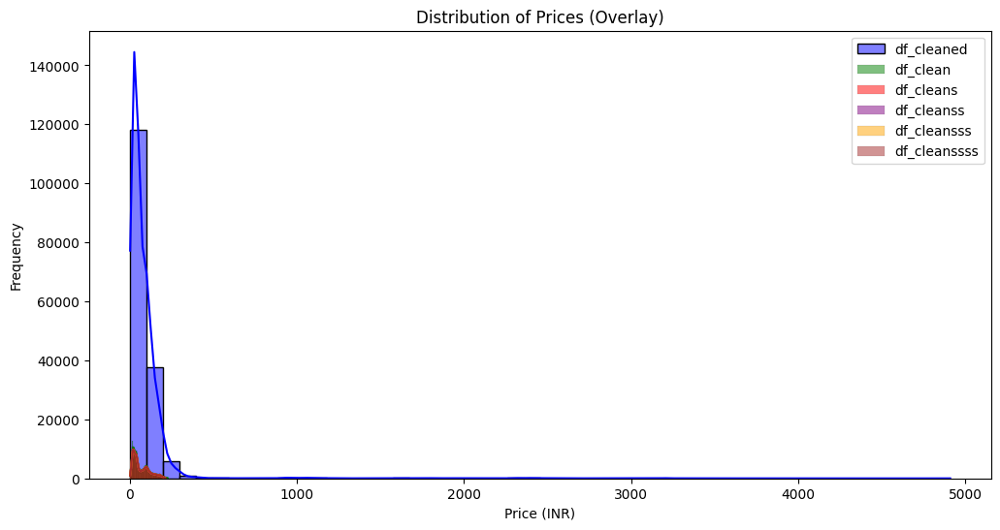

In [ ]:
plt.figure(figsize=(12, 6))
colors = ["blue", "green", "red", "purple", "orange", "brown"]
for df, color, name in zip(dfs, colors, df_names):
    sns.histplot(df["price"], bins=50, kde=True, label=name, color=color, alpha=0.5)

plt.title("Distribution of Prices (Overlay)")
plt.xlabel("Price (INR)")
plt.ylabel("Frequency")
plt.legend()
plt.show()

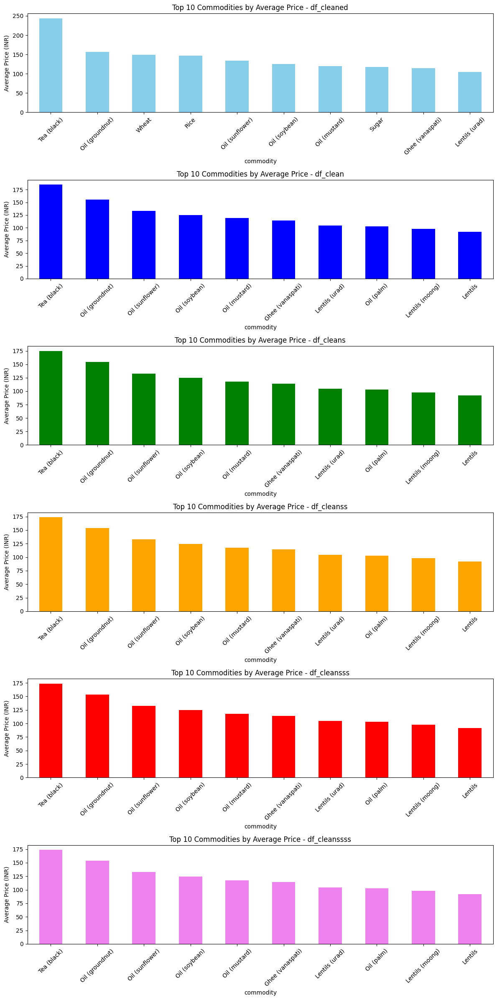

In [ ]:
dfs = [df_cleaned, df_clean, df_cleans, df_cleanss, df_cleansss, df_cleanssss]
df_names = ["df_cleaned", "df_clean", "df_cleans", "df_cleanss", "df_cleansss", "df_cleanssss"]
colors = ["skyblue", "blue", "green", "orange", "red", "violet"]
fig, axes = plt.subplots(nrows=len(dfs), ncols=1, figsize=(12, len(dfs) * 4))
for ax, df, name, color in zip(axes, dfs, df_names, colors):
    top_commodities = df.groupby("commodity")["price"].mean().nlargest(10)
    top_commodities.plot(kind='bar', ax=ax, color=color)
    ax.set_title(f"Top 10 Commodities by Average Price - {name}")
    ax.set_ylabel("Average Price (INR)")
    ax.set_xticklabels(top_commodities.index, rotation=45)
plt.tight_layout()
plt.show()

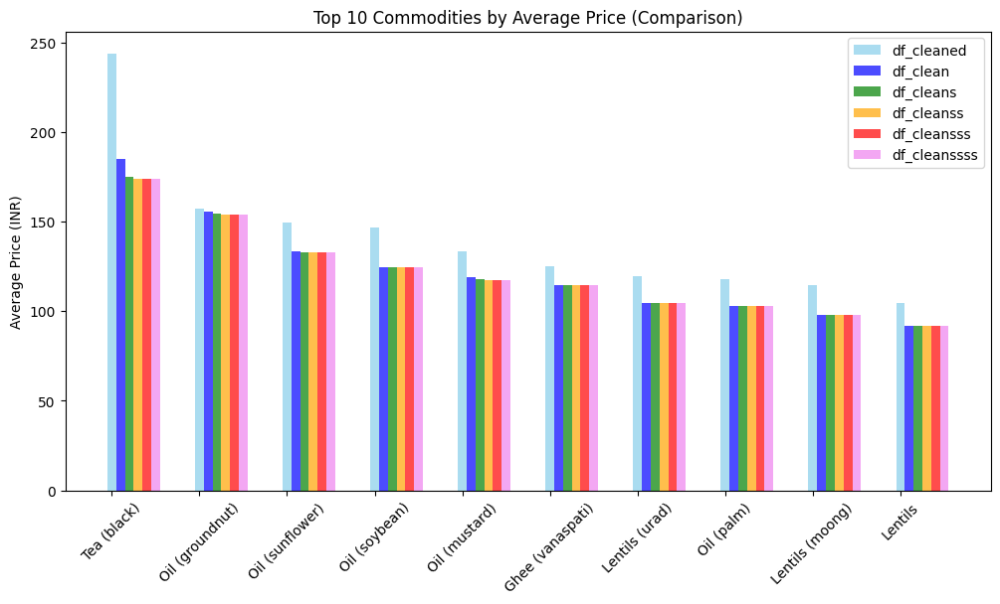

In [ ]:
plt.figure(figsize=(12, 6))
x = np.arange(10)
for i, (df, name, color) in enumerate(zip(dfs, df_names, colors)):
    top_commodities = df.groupby("commodity")["price"].mean().nlargest(10)
    plt.bar(x + (i * 0.1), top_commodities.values, width=0.1, label=name, color=color, alpha=0.7)
plt.xticks(x, top_commodities.index, rotation=45)
plt.title("Top 10 Commodities by Average Price (Comparison)")
plt.ylabel("Average Price (INR)")
plt.legend()
plt.show()


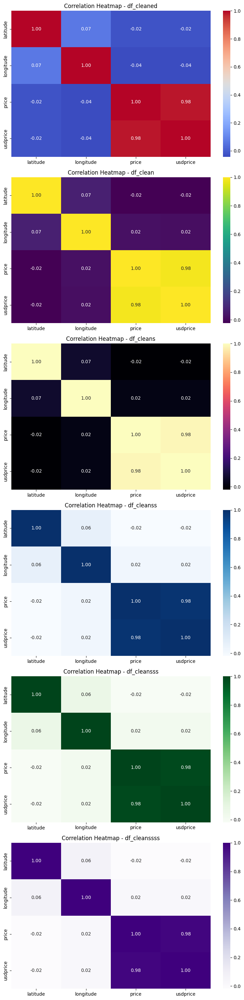

In [ ]:
dfs = [df_cleaned, df_clean, df_cleans, df_cleanss, df_cleansss, df_cleanssss]
df_names = ["df_cleaned", "df_clean", "df_cleans", "df_cleanss", "df_cleansss", "df_cleanssss"]
colors = ["coolwarm", "viridis", "magma", "Blues", "Greens", "Purples"]
fig, axes = plt.subplots(nrows=len(dfs), ncols=1, figsize=(8, len(dfs) * 5))
for ax, df, name, color in zip(axes, dfs, df_names, colors):
    sns.heatmap(df.corr(numeric_only=True), annot=True, cmap=color, fmt='.2f', ax=ax)
    ax.set_title(f"Correlation Heatmap - {name}")
plt.tight_layout()
plt.show()

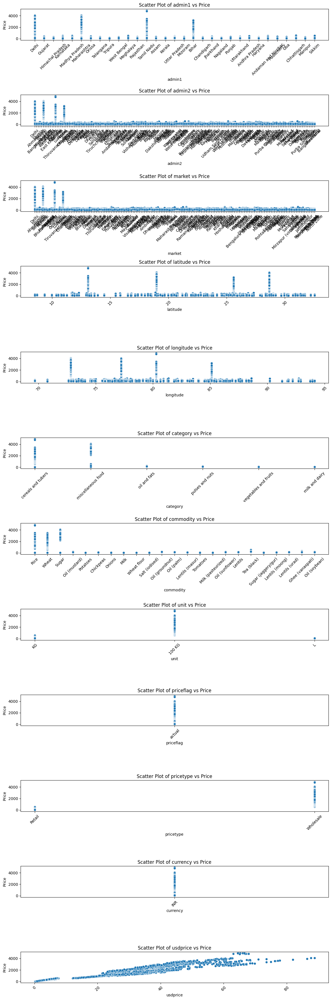

In [ ]:
features = ['admin1', 'admin2', 'market', 'latitude', 'longitude', 'category', 'commodity',
            'unit', 'priceflag', 'pricetype', 'currency', 'usdprice']
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(12, len(features) * 3))
for ax, feature in zip(axes, features):
    sns.scatterplot(x=df_cleaned[feature], y=df_cleaned['price'], ax=ax)
    ax.set_title(f'Scatter Plot of {feature} vs Price')
    ax.set_xlabel(feature)
    ax.set_ylabel('Price')
    ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

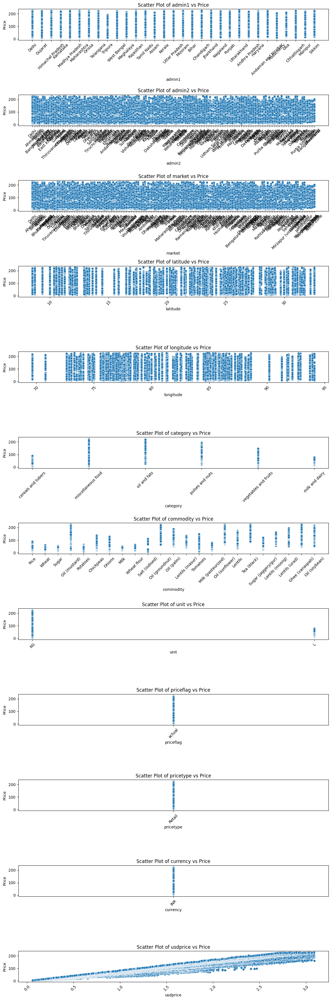

In [ ]:
features = ['admin1', 'admin2', 'market', 'latitude', 'longitude', 'category', 'commodity',
            'unit', 'priceflag', 'pricetype', 'currency', 'usdprice']
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(12, len(features) * 3))
for ax, feature in zip(axes, features):
    sns.scatterplot(x=df_clean[feature], y=df_clean['price'], ax=ax)
    ax.set_title(f'Scatter Plot of {feature} vs Price')
    ax.set_xlabel(feature)
    ax.set_ylabel('Price')
    ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

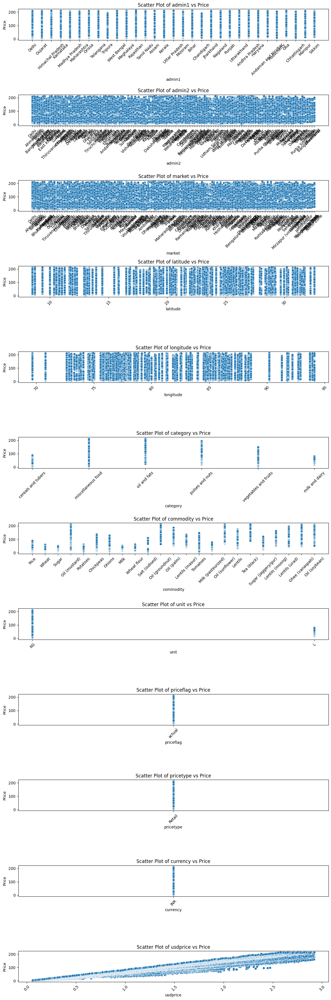

In [ ]:
features = ['admin1', 'admin2', 'market', 'latitude', 'longitude', 'category', 'commodity',
            'unit', 'priceflag', 'pricetype', 'currency', 'usdprice']
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(12, len(features) * 3))
for ax, feature in zip(axes, features):
    sns.scatterplot(x=df_cleans[feature], y=df_cleans['price'], ax=ax)
    ax.set_title(f'Scatter Plot of {feature} vs Price')
    ax.set_xlabel(feature)
    ax.set_ylabel('Price')
    ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

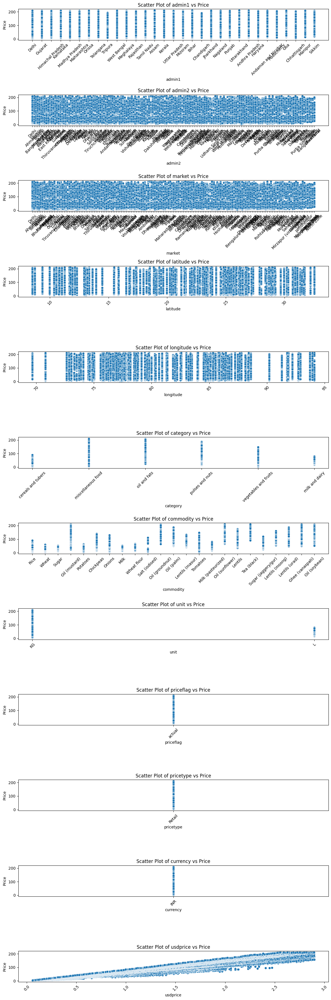

In [ ]:
features = ['admin1', 'admin2', 'market', 'latitude', 'longitude', 'category', 'commodity',
            'unit', 'priceflag', 'pricetype', 'currency', 'usdprice']
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(12, len(features) * 3))
for ax, feature in zip(axes, features):
    sns.scatterplot(x=df_cleanss[feature], y=df_cleanss['price'], ax=ax)
    ax.set_title(f'Scatter Plot of {feature} vs Price')
    ax.set_xlabel(feature)
    ax.set_ylabel('Price')
    ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

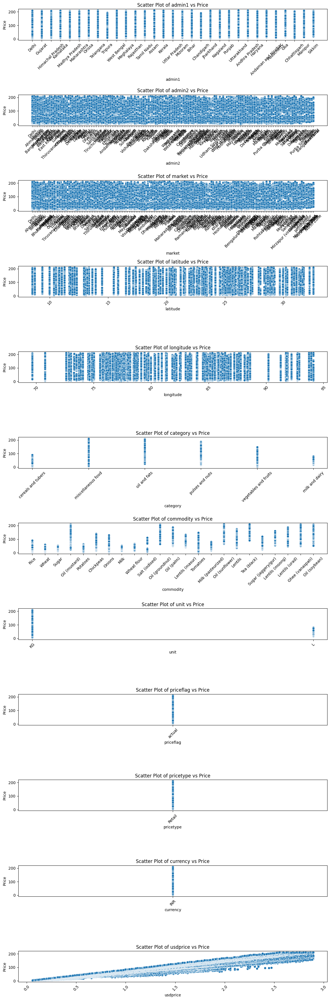

In [ ]:
features = ['admin1', 'admin2', 'market', 'latitude', 'longitude', 'category', 'commodity',
            'unit', 'priceflag', 'pricetype', 'currency', 'usdprice']
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(12, len(features) * 3))
for ax, feature in zip(axes, features):
    sns.scatterplot(x=df_cleansss[feature], y=df_cleansss['price'], ax=ax)
    ax.set_title(f'Scatter Plot of {feature} vs Price')
    ax.set_xlabel(feature)
    ax.set_ylabel('Price')
    ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

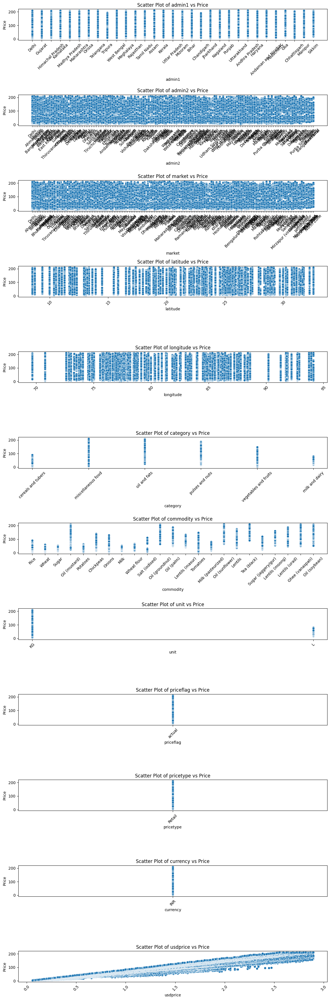

In [ ]:
features = ['admin1', 'admin2', 'market', 'latitude', 'longitude', 'category', 'commodity',
            'unit', 'priceflag', 'pricetype', 'currency', 'usdprice']
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(12, len(features) * 3))
for ax, feature in zip(axes, features):
    sns.scatterplot(x=df_cleanssss[feature], y=df_cleanssss['price'], ax=ax)
    ax.set_title(f'Scatter Plot of {feature} vs Price')
    ax.set_xlabel(feature)
    ax.set_ylabel('Price')
    ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
df_cleaned["year"] = pd.to_datetime(df_cleaned["date"]).dt.year
sns.set_style("whitegrid")
def plot_price_trends(df):
    unique_markets = df["market"].unique()
    for market in unique_markets:
        plt.figure(figsize=(12, 6))
        subset = df[df["market"] == market]
        if not subset.empty:
            for commodity in subset["commodity"].unique():
                data = subset[subset["commodity"] == commodity]
                plt.plot(data["year"], data["price"], marker="o", linestyle="-", label=commodity)

            plt.xlabel("Year")
            plt.ylabel("Price")
            plt.title(f"Price Trends of Commodities in {market}")
            plt.legend()
            plt.xticks(rotation=45)
            plt.show()
plot_price_trends(df_cleaned)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
sns.set_style("whitegrid")
def plot_price_trend(df):
    grouped = df.groupby(["market", "commodity"])
    unique_years = sorted(df["year"].unique())
    for (market, commodity), subset in grouped:
        if subset.empty:
            continue
        plt.figure(figsize=(12, 6))
        plt.plot(subset["year"], subset["price"], marker="o", linestyle="-", color="blue", label=commodity)
        plt.xlabel("Year")
        plt.ylabel("Price")
        plt.title(f"Price of {commodity} in {market}")
        plt.legend()
        plt.xticks(unique_years, rotation=45)
        plt.show()
plot_price_trend(df_cleaned)

In [ ]:
df_cleanssss.head(10)

,date,admin1,admin2,market,latitude,longitude,category,commodity,unit,priceflag,pricetype,currency,price,usdprice
0,1994-01-15,Delhi,Delhi,Delhi,28.666667,77.216667,cereals and tubers,Rice,KG,actual,Retail,INR,8.00,0.2550
1,1994-01-15,Delhi,Delhi,Delhi,28.666667,77.216667,cereals and tubers,Wheat,KG,actual,Retail,INR,5.00,0.1594
2,1994-01-15,Delhi,Delhi,Delhi,28.666667,77.216667,miscellaneous food,Sugar,KG,actual,Retail,INR,13.50,0.4303
3,1994-01-15,Delhi,Delhi,Delhi,28.666667,77.216667,oil and fats,Oil (mustard),KG,actual,Retail,INR,31.00,0.9880
4,1994-01-15,Gujarat,Ahmadabad,Ahmedabad,23.033333,72.616667,cereals and tubers,Rice,KG,actual,Retail,INR,6.80,0.2167
5,1994-01-15,Gujarat,Ahmadabad,Ahmedabad,23.033333,72.616667,cereals and tubers,Wheat,KG,actual,Retail,INR,6.20,0.1976
6,1994-01-15,Gujarat,Ahmadabad,Ahmedabad,23.033333,72.616667,miscellaneous food,Sugar,KG,actual,Retail,INR,13.50,0.4303
7,1994-01-15,Gujarat,Ahmadabad,Ahmedabad,23.033333,72.616667,oil and fats,Oil (mustard),KG,actual,Retail,INR,30.00,0.9562
8,1994-01-15,Himachal Pradesh,Shimla,Shimla,31.103333,77.172222,miscellaneous food,Sugar,KG,actual,Retail,INR,13.75,0.4382
9,1994-01-15,Karnataka,Bangalore Urban,Bengaluru,12.962299,77.576943,cereals and tubers,Rice,KG,actual,Retail,INR,6.50,0.2072


In [ ]:
df_cleanssss.tail(10)

,date,admin1,admin2,market,latitude,longitude,category,commodity,unit,priceflag,pricetype,currency,price,usdprice
165439,2024-12-15,Rajasthan,Jaipur,North Zone,26.938848,75.800056,miscellaneous food,Sugar,KG,actual,Retail,INR,44.71,0.5274
165440,2024-12-15,Rajasthan,Jaipur,North Zone,26.938848,75.800056,miscellaneous food,Sugar (jaggery/gur),KG,actual,Retail,INR,52.63,0.6208
165442,2024-12-15,Rajasthan,Jaipur,North Zone,26.938848,75.800056,oil and fats,Oil (groundnut),KG,actual,Retail,INR,202.02,2.3830
165443,2024-12-15,Rajasthan,Jaipur,North Zone,26.938848,75.800056,oil and fats,Oil (mustard),KG,actual,Retail,INR,161.84,1.9091
165444,2024-12-15,Rajasthan,Jaipur,North Zone,26.938848,75.800056,oil and fats,Oil (palm),KG,actual,Retail,INR,117.70,1.3884
165445,2024-12-15,Rajasthan,Jaipur,North Zone,26.938848,75.800056,oil and fats,Oil (soybean),KG,actual,Retail,INR,137.85,1.6261
165446,2024-12-15,Rajasthan,Jaipur,North Zone,26.938848,75.800056,oil and fats,Oil (sunflower),KG,actual,Retail,INR,146.26,1.7253
165447,2024-12-15,Rajasthan,Jaipur,North Zone,26.938848,75.800056,pulses and nuts,Lentils (moong),KG,actual,Retail,INR,114.13,1.3463
165448,2024-12-15,Rajasthan,Jaipur,North Zone,26.938848,75.800056,vegetables and fruits,Onions,KG,actual,Retail,INR,53.86,0.6353
165449,2024-12-15,Rajasthan,Jaipur,North Zone,26.938848,75.800056,vegetables and fruits,Tomatoes,KG,actual,Retail,INR,68.76,0.8111


In [ ]:
df_cleanssss.describe()

,date,latitude,longitude,price,usdprice
count,156916,156916.000000,156916.000000,156916.000000,156916.000000
mean,2018-08-01 14:42:06.579826176,22.491838,80.239225,66.789586,0.937161
min,1994-01-15 00:00:00,8.506944,69.666690,2.500000,0.057100
25%,2016-03-15 00:00:00,18.866667,76.283333,26.400000,0.387200
50%,2020-06-15 00:00:00,23.350000,78.157870,47.130000,0.674000
75%,2022-03-15 00:00:00,26.716111,84.853584,100.000000,1.391100
max,2024-12-15 00:00:00,32.553589,94.116667,210.310000,2.895600
std,NaN,6.190138,5.660362,49.251703,0.653485


In [ ]:
df_cleanssss.info()

<class 'pandas.core.frame.DataFrame'>
Index: 156916 entries, 0 to 165449
Data columns (total 14 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   date       156916 non-null  datetime64[ns]
 1   admin1     156916 non-null  object        
 2   admin2     156916 non-null  object        
 3   market     156916 non-null  object        
 4   latitude   156916 non-null  float64       
 5   longitude  156916 non-null  float64       
 6   category   156916 non-null  object        
 7   commodity  156916 non-null  object        
 8   unit       156916 non-null  object        
 9   priceflag  156916 non-null  object        
 10  pricetype  156916 non-null  object        
 11  currency   156916 non-null  object        
 12  price      156916 non-null  float64       
 13  usdprice   156916 non-null  float64       
dtypes: datetime64[ns](1), float64(4), object(9)
memory usage: 18.0+ MB


In [ ]:
for c in df_cleanssss.columns:
    print(f"Unique values in column '{c}': {df_cleanssss[c].nunique()}")

Unique values in column 'date': 372
Unique values in column 'admin1': 31
Unique values in column 'admin2': 163
Unique values in column 'market': 169
Unique values in column 'latitude': 168
Unique values in column 'longitude': 166
Unique values in column 'category': 6
Unique values in column 'commodity': 23
Unique values in column 'unit': 2
Unique values in column 'priceflag': 1
Unique values in column 'pricetype': 1
Unique values in column 'currency': 1
Unique values in column 'price': 16985
Unique values in column 'usdprice': 23965


In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.svm import LinearSVR
from sklearn.pipeline import make_pipeline

In [ ]:
datasets = ["df_cleaned", "df_cleanssss"]
categorical_cols = ["admin1", "admin2", "market", "category", "commodity", "unit", "priceflag", "pricetype", "currency"]

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.svm import LinearSVR
from sklearn.metrics import mean_absolute_error, mean_squared_error
X_dict, y_dict = {}, {}
for dataset_name in datasets:
    dataset = globals()[dataset_name].copy()
    if dataset.iloc[0].astype(str).str.startswith("#").any():
        dataset = dataset.iloc[1:].reset_index(drop=True)
    dataset["date"] = pd.to_datetime(dataset["date"], errors="coerce")
    dataset["year"] = dataset["date"].dt.year
    dataset["month"] = dataset["date"].dt.month
    dataset["day"] = dataset["date"].dt.day
    num_cols = ["latitude", "longitude", "price", "usdprice"]
    for col in num_cols:
        dataset[col] = pd.to_numeric(dataset[col], errors="coerce")
        if dataset[col].dtype in ["float64", "int64"]:
            dataset[col] = dataset[col].fillna(dataset[col].median())
    categorical_cols = ["admin1", "admin2", "market", "category", "commodity", "unit", "priceflag", "pricetype", "currency"]
    label_encoders = {col: LabelEncoder() for col in categorical_cols}
    for col in categorical_cols:
        dataset[col] = label_encoders[col].fit_transform(dataset[col].astype(str))
    features = ["admin1", "admin2", "market", "latitude", "longitude", "category", "commodity", "unit",
                "priceflag", "pricetype", "currency", "year", "month", "day"]
    X_dict[dataset_name] = dataset[features].values
    y_dict[dataset_name] = dataset["price"].values

In [ ]:
train_test_splits = {}
for dataset_name in datasets:
    X_train, X_test, y_train, y_test = train_test_split(
        X_dict[dataset_name], y_dict[dataset_name], test_size=0.2, random_state=42
    )
    train_test_splits[dataset_name] = {
        "X_train": X_train, "X_test": X_test, "y_train": y_train, "y_test": y_test
    }

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.svm import LinearSVR
from sklearn.metrics import mean_absolute_error, mean_squared_error
svm_models, svm_results = {}, {}
for dataset_name in datasets:
    X_train, X_test, y_train, y_test = train_test_split(
        X_dict[dataset_name], y_dict[dataset_name], test_size=0.2, random_state=42
    )
    model = make_pipeline(StandardScaler(), LinearSVR(C=1.0, max_iter=1000))
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    svm_models[dataset_name] = model
    svm_results[dataset_name] = {"MAE": mae, "MSE": mse, "RMSE": rmse}
for dataset, results in svm_results.items():
    print(f"Dataset: {dataset} -> MAE: {results['MAE']:.4f}, MSE: {results['MSE']:.4f}, RMSE: {results['RMSE']:.4f}")

Dataset: df_cleaned -> MAE: 41.7953, MSE: 12448.1206, RMSE: 111.5711
Dataset: df_cleanssss -> MAE: 26.3567, MSE: 1505.8607, RMSE: 38.8054


In [ ]:
rf_models, rf_results = {}, {}
for dataset_name in datasets:
    X_train = train_test_splits[dataset_name]["X_train"]
    X_test = train_test_splits[dataset_name]["X_test"]
    y_train = train_test_splits[dataset_name]["y_train"]
    y_test = train_test_splits[dataset_name]["y_test"]

    model = RandomForestRegressor(n_estimators=100, n_jobs=-1, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    rf_models[dataset_name] = model
    rf_results[dataset_name] = {"MAE": mae, "MSE": mse, "RMSE": rmse}

for dataset, results in rf_results.items():
    print(f"Dataset: {dataset} -> MAE: {results['MAE']:.4f}, MSE: {results['MSE']:.4f}, RMSE: {results['RMSE']:.4f}")


Dataset: df_cleaned -> MAE: 3.5638, MSE: 161.0733, RMSE: 12.6915
Dataset: df_cleanssss -> MAE: 2.6036, MSE: 22.7854, RMSE: 4.7734


In [ ]:
xgb_models, xgb_results = {}, {}
for dataset_name in datasets:
    X_train = train_test_splits[dataset_name]["X_train"]
    X_test = train_test_splits[dataset_name]["X_test"]
    y_train = train_test_splits[dataset_name]["y_train"]
    y_test = train_test_splits[dataset_name]["y_test"]

    model = XGBRegressor(n_estimators=100, learning_rate=0.1, tree_method="hist", n_jobs=-1, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    xgb_models[dataset_name] = model
    xgb_results[dataset_name] = {"MAE": mae, "MSE": mse, "RMSE": rmse}

for dataset, results in xgb_results.items():
    print(f"Dataset: {dataset} -> MAE: {results['MAE']:.4f}, MSE: {results['MSE']:.4f}, RMSE: {results['RMSE']:.4f}")

Dataset: df_cleaned -> MAE: 8.8981, MSE: 392.5146, RMSE: 19.8120
Dataset: df_cleanssss -> MAE: 6.1277, MSE: 85.3647, RMSE: 9.2393


In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import skew, kurtosis
from sklearn.preprocessing import LabelEncoder
def calculate_skewness_kurtosis(dataset, dataset_name, features):
    print(f"Skewness and Kurtosis for {dataset_name}:")
    for feature in features:
        if feature in dataset.columns:
            if dataset[feature].dtype == "object":
                le = LabelEncoder()
                dataset[feature] = le.fit_transform(dataset[feature].astype(str))
            if np.issubdtype(dataset[feature].dtype, np.number):
                skewness = skew(dataset[feature].dropna())
                kurt = kurtosis(dataset[feature].dropna())
                print(f"{feature}: Skewness = {skewness:.4f}, Kurtosis = {kurt:.4f}")

    print("\n")
datasets = {
    "df_cleaned": df_cleaned,
    "df_clean": df_clean,
    "df_cleans": df_cleans,
    "df_cleanss": df_cleanss,
    "df_cleansss": df_cleansss,
    "df_cleanssss": df_cleanssss
}
features = ["admin1", "admin2", "market", "latitude", "longitude", "category", "commodity", "unit",
            "priceflag", "pricetype", "currency", "year", "month", "day"]
for name, df in datasets.items():
    calculate_skewness_kurtosis(df, name, features)

Skewness and Kurtosis for df_cleaned:
admin1: Skewness = -0.0114, Kurtosis = -1.1631
admin2: Skewness = 0.1964, Kurtosis = -1.0778
market: Skewness = 0.0874, Kurtosis = -1.1192
latitude: Skewness = -0.5688, Kurtosis = -0.6436
longitude: Skewness = 0.7397, Kurtosis = -0.3520
category: Skewness = -0.1618, Kurtosis = -1.0881
commodity: Skewness = -0.2105, Kurtosis = -1.1365
unit: Skewness = 2.1903, Kurtosis = 12.3560
priceflag: Skewness = nan, Kurtosis = nan
pricetype: Skewness = 9.3356, Kurtosis = 85.1528
currency: Skewness = nan, Kurtosis = nan


Skewness and Kurtosis for df_clean:
admin1: Skewness = -0.0168, Kurtosis = -1.1594
admin2: Skewness = 0.1982, Kurtosis = -1.0753
market: Skewness = 0.0871, Kurtosis = -1.1207
latitude: Skewness = -0.5790, Kurtosis = -0.6219
longitude: Skewness = 0.7345, Kurtosis = -0.3738
category: Skewness = -0.1976, Kurtosis = -1.1099


<ipython-input-86-c294c3904216>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[feature] = le.fit_transform(dataset[feature].astype(str))
<ipython-input-86-c294c3904216>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[feature] = le.fit_transform(dataset[feature].astype(str))
<ipython-input-86-c294c3904216>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

commodity: Skewness = -0.1470, Kurtosis = -1.1307
unit: Skewness = 3.9785, Kurtosis = 13.8288
priceflag: Skewness = nan, Kurtosis = nan
pricetype: Skewness = nan, Kurtosis = nan
currency: Skewness = nan, Kurtosis = nan


Skewness and Kurtosis for df_cleans:
admin1: Skewness = -0.0155, Kurtosis = -1.1602
admin2: Skewness = 0.1977, Kurtosis = -1.0751
market: Skewness = 0.0865, Kurtosis = -1.1208
latitude: Skewness = -0.5807, Kurtosis = -0.6157


<ipython-input-86-c294c3904216>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[feature] = le.fit_transform(dataset[feature].astype(str))
<ipython-input-86-c294c3904216>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[feature] = le.fit_transform(dataset[feature].astype(str))
<ipython-input-86-c294c3904216>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

longitude: Skewness = 0.7323, Kurtosis = -0.3773
category: Skewness = -0.1983, Kurtosis = -1.1202
commodity: Skewness = -0.1419, Kurtosis = -1.1293
unit: Skewness = 3.9627, Kurtosis = 13.7028
priceflag: Skewness = nan, Kurtosis = nan
pricetype: Skewness = nan, Kurtosis = nan
currency: Skewness = nan, Kurtosis = nan


Skewness and Kurtosis for df_cleanss:
admin1: Skewness = -0.0154, Kurtosis = -1.1604


<ipython-input-86-c294c3904216>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[feature] = le.fit_transform(dataset[feature].astype(str))
<ipython-input-86-c294c3904216>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[feature] = le.fit_transform(dataset[feature].astype(str))
<ipython-input-86-c294c3904216>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

admin2: Skewness = 0.1976, Kurtosis = -1.0750
market: Skewness = 0.0867, Kurtosis = -1.1205
latitude: Skewness = -0.5810, Kurtosis = -0.6148
longitude: Skewness = 0.7322, Kurtosis = -0.3774
category: Skewness = -0.1980, Kurtosis = -1.1218
commodity: Skewness = -0.1418, Kurtosis = -1.1293
unit: Skewness = 3.9602, Kurtosis = 13.6833
priceflag: Skewness = nan, Kurtosis = nan
pricetype: Skewness = nan, Kurtosis = nan


<ipython-input-86-c294c3904216>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[feature] = le.fit_transform(dataset[feature].astype(str))
<ipython-input-86-c294c3904216>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[feature] = le.fit_transform(dataset[feature].astype(str))
<ipython-input-86-c294c3904216>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

currency: Skewness = nan, Kurtosis = nan


Skewness and Kurtosis for df_cleansss:
admin1: Skewness = -0.0155, Kurtosis = -1.1605
admin2: Skewness = 0.1976, Kurtosis = -1.0750
market: Skewness = 0.0867, Kurtosis = -1.1205
latitude: Skewness = -0.5810, Kurtosis = -0.6147
longitude: Skewness = 0.7321, Kurtosis = -0.3775
category: Skewness = -0.1981, Kurtosis = -1.1219
commodity: Skewness = -0.1418, Kurtosis = -1.1292
unit: Skewness = 3.9600, Kurtosis = 13.6818


<ipython-input-86-c294c3904216>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[feature] = le.fit_transform(dataset[feature].astype(str))
<ipython-input-86-c294c3904216>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[feature] = le.fit_transform(dataset[feature].astype(str))
<ipython-input-86-c294c3904216>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

priceflag: Skewness = nan, Kurtosis = nan
pricetype: Skewness = nan, Kurtosis = nan
currency: Skewness = nan, Kurtosis = nan


Skewness and Kurtosis for df_cleanssss:
admin1: Skewness = -0.0155, Kurtosis = -1.1605
admin2: Skewness = 0.1976, Kurtosis = -1.0750
market: Skewness = 0.0867, Kurtosis = -1.1205
latitude: Skewness = -0.5810, Kurtosis = -0.6147
longitude: Skewness = 0.7321, Kurtosis = -0.3775
category: Skewness = -0.1981, Kurtosis = -1.1219
commodity: Skewness = -0.1418, Kurtosis = -1.1292
unit: Skewness = 3.9600, Kurtosis = 13.6818
priceflag: Skewness = nan, Kurtosis = nan
pricetype: Skewness = nan, Kurtosis = nan
currency: Skewness = nan, Kurtosis = nan




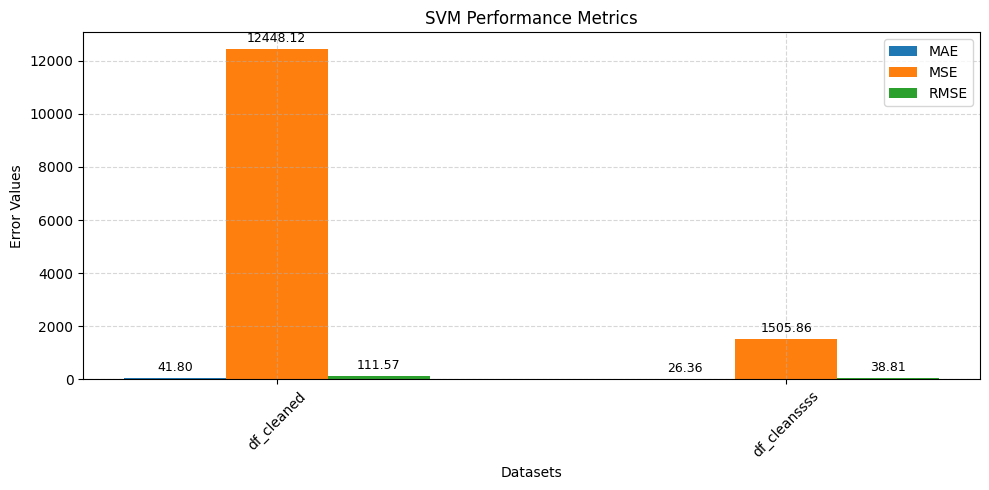

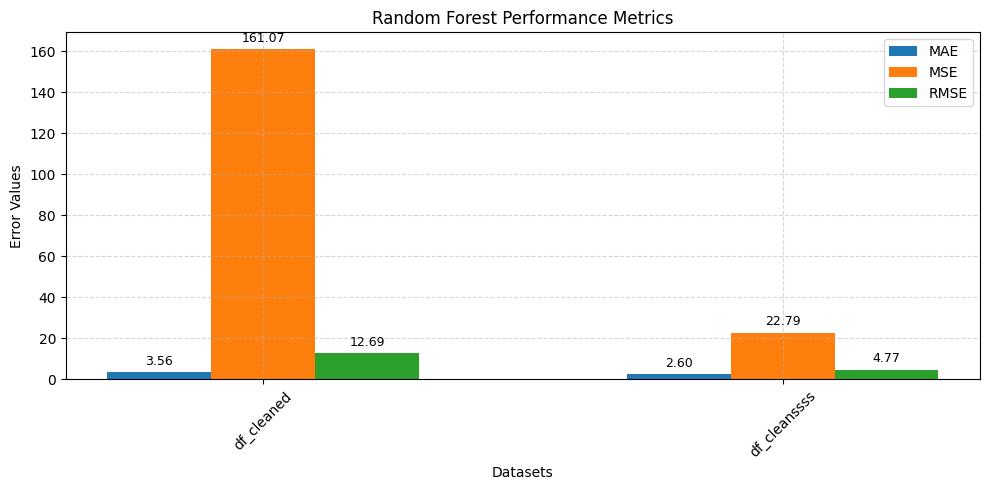

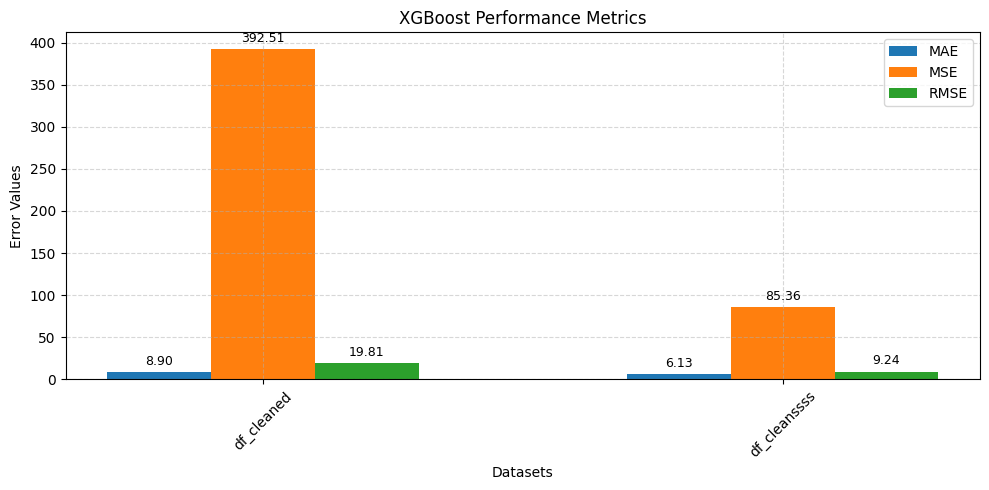

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_metricss(results, model_name):
    metrics = ["MAE", "MSE", "RMSE"]
    datasets = list(results.keys())
    values = {metric: [results[ds][metric] for ds in datasets] for metric in metrics}

    x = np.arange(len(datasets))
    width = 0.2

    fig, ax = plt.subplots(figsize=(10, 5))

    for i, metric in enumerate(metrics):
        bars = ax.bar(x + i * width, values[metric], width, label=metric)

        # Add numeric values on top of bars
        for bar in bars:
            height = bar.get_height()
            ax.annotate(f'{height:.2f}',
                        xy=(bar.get_x() + bar.get_width() / 2, height),
                        xytext=(0, 3),  # small vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom', fontsize=9)

    ax.set_xlabel("Datasets")
    ax.set_ylabel("Error Values")
    ax.set_title(f"{model_name} Performance Metrics")
    ax.set_xticks(x + width)
    ax.set_xticklabels(datasets, rotation=45)
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()

plot_metricss(svm_results, "SVM")
plot_metricss(rf_results, "Random Forest")
plot_metricss(xgb_results, "XGBoost")


In [ ]:
import numpy as np
import pandas as pd
def calculate_outlier_percentage(df):
    outlier_counts = 0
    total_values = df.shape[0]
    for col in df.select_dtypes(include=['number']).columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
        outlier_counts += len(outliers)

    return (outlier_counts / total_values) * 100 if total_values > 0 else 0
datasets = {
    "df_cleaned": df_cleaned,
    "df_clean": df_clean,
    "df_cleans": df_cleans,
    "df_cleanss": df_cleanss,
    "df_cleansss": df_cleansss,
    "df_cleanssss": df_cleanssss
}

outlier_percentages = {name: calculate_outlier_percentage(df) for name, df in datasets.items()}
print("Outlier Percentages for Each Dataset:")
for dataset, percentage in outlier_percentages.items():
    print(f"{dataset}: {percentage:.2f}%")

Outlier Percentages for Each Dataset:
df_cleaned: 7.35%
df_clean: 0.86%
df_cleans: 0.11%
df_cleanss: 0.01%
df_cleansss: 0.00%
df_cleanssss: 0.00%


Fitting ARIMA model for df_cleaned


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/p

Metrics for df_cleaned:
MSE: 4586.571122457605
MAE: 54.24196377636689
RMSE: 67.72422847443598



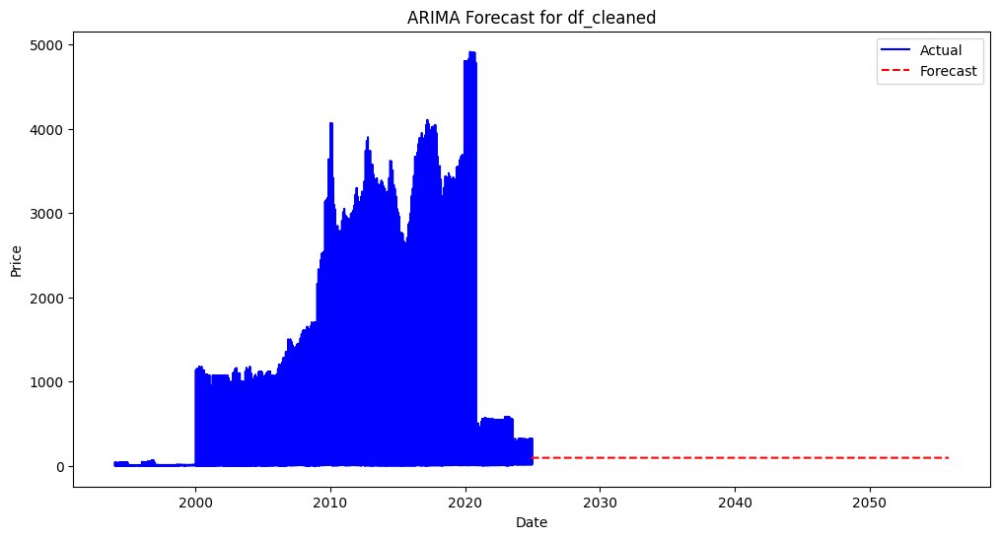

Fitting ARIMA model for df_cleanssss


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/u

Metrics for df_cleanssss:
MSE: 2751.0573384140716
MAE: 46.83015137659478
RMSE: 52.45052276587977



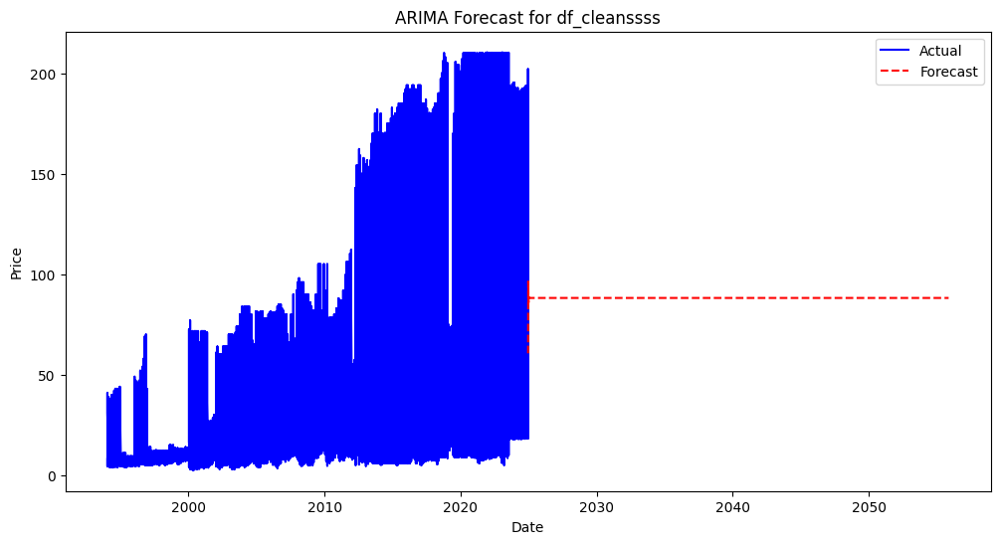

Final Results:
{'df_cleaned': {'MSE': 4586.571122457605, 'MAE': 54.24196377636689, 'RMSE': np.float64(67.72422847443598)}, 'df_cleanssss': {'MSE': 2751.0573384140716, 'MAE': 46.83015137659478, 'RMSE': np.float64(52.45052276587977)}}


In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error, mean_absolute_error
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def fit_arima_model(dataset, dataset_name, order=(5,1,2)):
    print(f"Fitting ARIMA model for {dataset_name}")
    dataset["price"] = pd.to_numeric(dataset["price"], errors="coerce")
    dataset = dataset.dropna(subset=["price"])
    dataset.loc[:, "date"] = pd.to_datetime(dataset["date"], errors="coerce")
    dataset = dataset.set_index("date").sort_index()
    if dataset.empty:
        print(f"Skipping {dataset_name}: No valid numerical data after cleaning.")
        return None
    result = adfuller(dataset["price"])
    if result[1] > 0.05:
        dataset["price"] = dataset["price"].diff().dropna()
    model = ARIMA(dataset["price"], order=order)
    model_fit = model.fit()
    start_date = dataset.index.min()
    end_date = "2024-12-15"
    forecast_steps = (pd.to_datetime(end_date) - pd.to_datetime(start_date)).days
    if forecast_steps <= 0:
        print(f"Skipping {dataset_name}: Not enough historical data for forecasting.")
        return None
    forecast = model_fit.forecast(steps=forecast_steps)
    actual = dataset["price"].values
    forecast_values = forecast[:len(actual)]
    min_length = min(len(actual), len(forecast_values))
    mse = mean_squared_error(actual[-min_length:], forecast_values[-min_length:])
    mae = mean_absolute_error(actual[-min_length:], forecast_values[-min_length:])
    rmse = np.sqrt(mse)
    print(f"Metrics for {dataset_name}:")
    print(f"MSE: {mse}")
    print(f"MAE: {mae}")
    print(f"RMSE: {rmse}\n")
    plt.figure(figsize=(12,6))
    plt.plot(dataset.index, dataset["price"], label="Actual", color='blue')
    plt.plot(pd.date_range(dataset.index[-1], periods=forecast_steps+1, freq="D")[1:],
             forecast, label="Forecast", linestyle="dashed", color='red')
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.title(f"ARIMA Forecast for {dataset_name}")
    plt.legend()
    plt.show()
    return {"MSE": mse, "MAE": mae, "RMSE": rmse}

datasets = {
    "df_cleaned": df_cleaned,
    "df_cleanssss": df_cleanssss
}

arima_results = {}
for name, df in datasets.items():
    df.shape
    arima_results[name] = fit_arima_model(df, name)

print("Final Results:")
print(arima_results)


Training LSTM model for df_cleaned...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 15s 4ms/step - loss: 0.0021
Epoch 2/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0020
Epoch 3/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 13s 5ms/step - loss: 0.0019
Epoch 4/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.0019
Epoch 5/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 19s 4ms/step - loss: 0.0019
Epoch 6/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0019
Epoch 7/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0018
Epoch 8/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 0.0019
Epoch 9/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0019
Epoch 10/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0018
Epoch 11/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 0.0019
Epoch 12/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 0.0018
Epoch 13/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.0018
Epoch 14/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0019
Epoch 15/50
2576/257

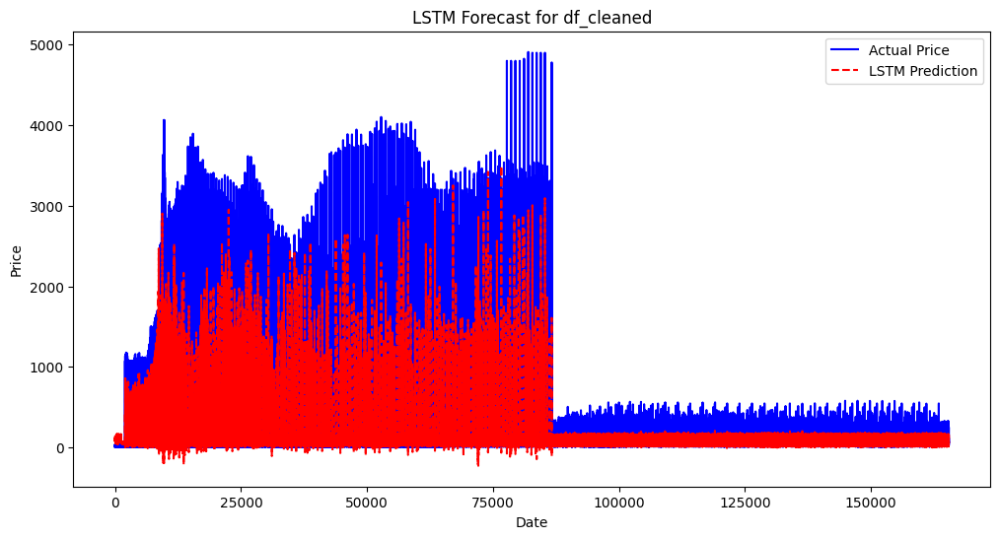

Training LSTM model for df_cleanssss...
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2452/2452 ━━━━━━━━━━━━━━━━━━━━ 15s 4ms/step - loss: 0.0342
Epoch 2/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 17s 4ms/step - loss: 0.0237
Epoch 3/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0223
Epoch 4/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0215
Epoch 5/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 0.0208
Epoch 6/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0203
Epoch 7/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0197
Epoch 8/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.0190
Epoch 9/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.0189
Epoch 10/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.0185
Epoch 11/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0185
Epoch 12/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0183
Epoch 13/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.0183
Epoch 14/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0179
Epoch 15/50
2452/2452 ━━━━━━━━

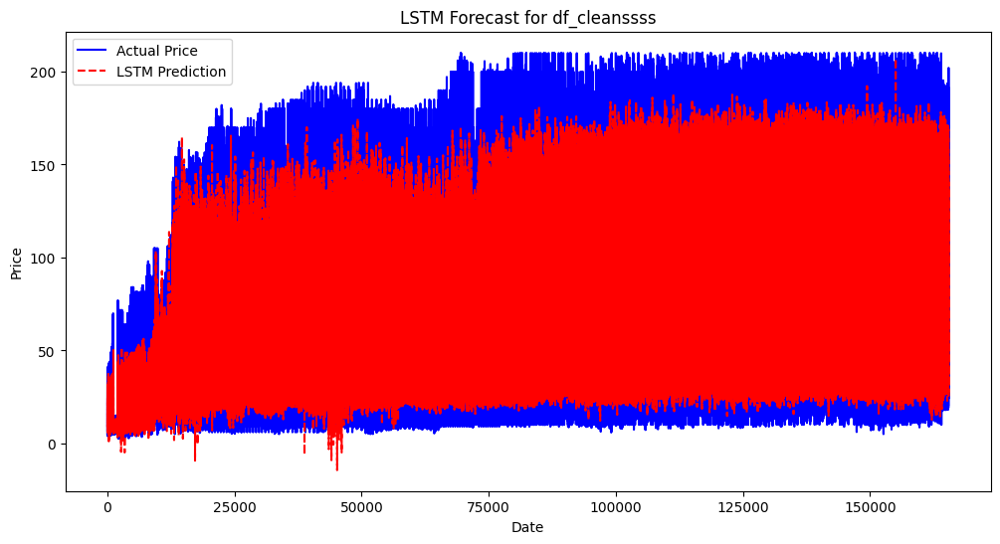

LSTM Model Results:
{'df_cleaned': {'MSE': 39441.208916480806, 'MAE': 57.87093376864377, 'RMSE': np.float64(198.59810904558182)}, 'df_cleanssss': {'MSE': 677.8254861425434, 'MAE': 18.131877639906406, 'RMSE': np.float64(26.03508183475795)}}


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
def prepare_data(dataset, time_steps=10):
    dataset = dataset.dropna().copy()
    scaler = MinMaxScaler(feature_range=(0, 1))
    dataset["scaled_price"] = scaler.fit_transform(dataset["price"].values.reshape(-1, 1))
    X, y = [], []
    for i in range(len(dataset) - time_steps):
        X.append(dataset["scaled_price"].values[i:i + time_steps])
        y.append(dataset["scaled_price"].values[i + time_steps])
    X, y = np.array(X), np.array(y)
    X, y = X[:len(y)], y[:len(X)]
    return X.reshape(X.shape[0], X.shape[1], 1), y, scaler
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(50, activation="relu", return_sequences=True, input_shape=input_shape),
        LSTM(50, activation="relu"),
        Dense(1)
    ])
    model.compile(optimizer="adam", loss="mse")
    return model
def train_lstm_model(dataset, dataset_name, time_steps=10, epochs=50, batch_size=64):
    print(f"Training LSTM model for {dataset_name}...")
    X, y, scaler = prepare_data(dataset, time_steps)
    if len(X) == 0 or len(y) == 0:
        print(f"Skipping {dataset_name}: Not enough data after processing.")
        return None
    model = build_lstm_model((time_steps, 1))
    history = model.fit(X, y, epochs=epochs, batch_size=batch_size, verbose=1)
    predicted_prices = model.predict(X)
    predicted_prices = scaler.inverse_transform(predicted_prices)
    actual_prices = dataset["price"].values[time_steps:]
    min_len = min(len(actual_prices), len(predicted_prices))
    actual_prices, predicted_prices = actual_prices[:min_len], predicted_prices[:min_len]
    mse = mean_squared_error(actual_prices, predicted_prices)
    mae = mean_absolute_error(actual_prices, predicted_prices)
    rmse = np.sqrt(mse)
    print(f"{dataset_name} - MSE: {mse:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}")
    plt.figure(figsize=(12, 6))
    plt.plot(dataset.index[time_steps:time_steps+min_len], actual_prices, label="Actual Price", color="blue")
    plt.plot(dataset.index[time_steps:time_steps+min_len], predicted_prices, label="LSTM Prediction", color="red", linestyle="dashed")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.title(f"LSTM Forecast for {dataset_name}")
    plt.legend()
    plt.show()
    return {"MSE": mse, "MAE": mae, "RMSE": rmse}
datasets = {
    "df_cleaned": df_cleaned,
    "df_cleanssss": df_cleanssss
}
datasets['df_cleaned'].shape
datasets['df_cleanssss'].shape
lstm_results = {}
for name, df in datasets.items():
    lstm_results[name] = train_lstm_model(df, name)
print("LSTM Model Results:")
print(lstm_results)

Training GRU model for df_cleaned...
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2576/2576 ━━━━━━━━━━━━━━━━━━━━ 16s 4ms/step - loss: 0.0021
Epoch 2/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 17s 4ms/step - loss: 0.0020
Epoch 3/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0019
Epoch 4/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0018
Epoch 5/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0019
Epoch 6/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0018
Epoch 7/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0019
Epoch 8/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0018
Epoch 9/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0018
Epoch 10/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 0.0018
Epoch 11/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0018
Epoch 12/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0018
Epoch 13/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0019
Epoch 14/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0018
Epoch 15/50
2576/2576 ━━━━━━━━

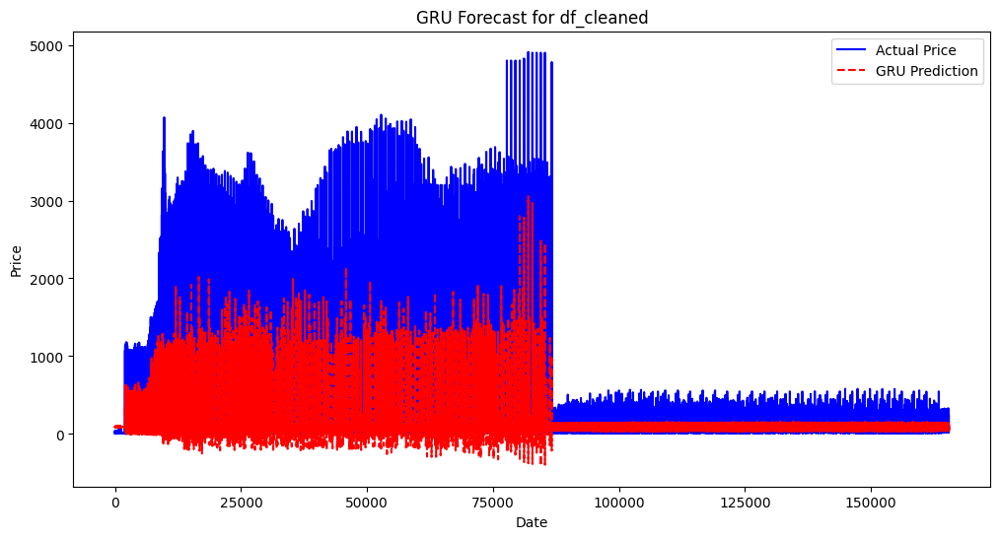

Training GRU model for df_cleanssss...
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2452/2452 ━━━━━━━━━━━━━━━━━━━━ 16s 4ms/step - loss: 0.0316
Epoch 2/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 0.0223
Epoch 3/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0217
Epoch 4/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0204
Epoch 5/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0194
Epoch 6/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0187
Epoch 7/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0185
Epoch 8/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0183
Epoch 9/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.0181
Epoch 10/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0181
Epoch 11/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0179
Epoch 12/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0175
Epoch 13/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0175
Epoch 14/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.0172
Epoch 15/50
2452/2452 ━━━━━━━━━━━

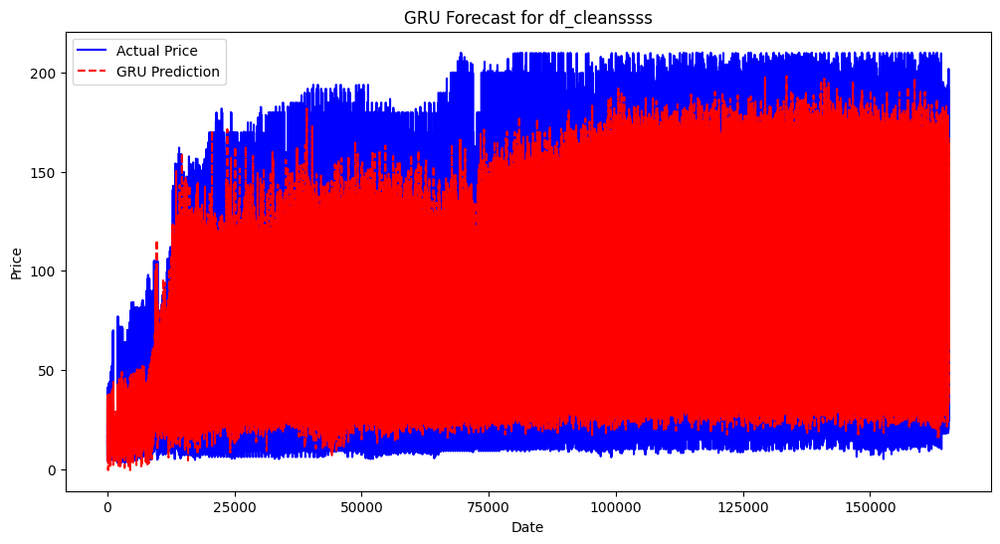

GRU Model Results:
{'df_cleaned': {'MSE': 41637.65284602806, 'MAE': 61.29985130713324, 'RMSE': np.float64(204.05306379965987)}, 'df_cleanssss': {'MSE': 665.2664492846956, 'MAE': 18.320677864594185, 'RMSE': np.float64(25.792759629103195)}}


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def prepare_data(dataset, time_steps=10):
    dataset = dataset.dropna().copy()

    if "price" not in dataset.columns:
        raise ValueError("Dataset must contain a 'price' column.")

    scaler = MinMaxScaler(feature_range=(0, 1))
    dataset["scaled_price"] = scaler.fit_transform(dataset["price"].values.reshape(-1, 1))

    X, y = [], []
    for i in range(len(dataset) - time_steps):
        X.append(dataset["scaled_price"].values[i:i + time_steps])
        y.append(dataset["scaled_price"].values[i + time_steps])

    X, y = np.array(X), np.array(y)

    return X.reshape(X.shape[0], X.shape[1], 1), y, scaler

def build_gru_model(input_shape):
    model = Sequential([
        GRU(50, activation="relu", return_sequences=True, input_shape=input_shape),
        GRU(50, activation="relu"),
        Dense(1)
    ])
    model.compile(optimizer="adam", loss="mse")
    return model

def train_gru_model(dataset, dataset_name, time_steps=10, epochs=50, batch_size=64):
    print(f"Training GRU model for {dataset_name}...")
    X, y, scaler = prepare_data(dataset, time_steps)
    if len(X) == 0 or len(y) == 0:
        print(f"Skipping {dataset_name}: Not enough data after processing.")
        return None

    model = build_gru_model((time_steps, 1))
    history = model.fit(X, y, epochs=epochs, batch_size=batch_size, verbose=1)

    predicted_prices = model.predict(X)
    predicted_prices = scaler.inverse_transform(predicted_prices.reshape(-1, 1))  # Ensure correct shape

    actual_prices = dataset["price"].values[time_steps:]

    min_len = min(len(actual_prices), len(predicted_prices))
    actual_prices, predicted_prices = actual_prices[:min_len], predicted_prices[:min_len]

    mse = mean_squared_error(actual_prices, predicted_prices)
    mae = mean_absolute_error(actual_prices, predicted_prices)
    rmse = np.sqrt(mse)

    print(f"{dataset_name} - MSE: {mse:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}")

    plt.figure(figsize=(12, 6))
    plt.plot(dataset.index[time_steps:time_steps+min_len], actual_prices, label="Actual Price", color="blue")
    plt.plot(dataset.index[time_steps:time_steps+min_len], predicted_prices, label="GRU Prediction", color="red", linestyle="dashed")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.title(f"GRU Forecast for {dataset_name}")
    plt.legend()
    plt.show()

    return {"MSE": mse, "MAE": mae, "RMSE": rmse}

# Ensure the datasets exist before using them
try:
    datasets = {
        "df_cleaned": df_cleaned,
        "df_cleanssss": df_cleanssss
    }
except NameError:
    raise NameError("Please define 'df_cleaned' and 'df_cleanssss' before running this script.")

gru_results = {}
for name, df in datasets.items():
    gru_results[name] = train_gru_model(df, name)

print("GRU Model Results:")
print(gru_results)


Training LSTM-GRU model for df_cleaned...
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2576/2576 ━━━━━━━━━━━━━━━━━━━━ 15s 4ms/step - loss: 0.0021
Epoch 2/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0020
Epoch 3/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0018
Epoch 4/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0019
Epoch 5/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0019
Epoch 6/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 0.0019
Epoch 7/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0017
Epoch 8/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0018
Epoch 9/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0017
Epoch 10/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.0018
Epoch 11/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0017
Epoch 12/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0017
Epoch 13/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0017
Epoch 14/50
2576/2576 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0018
Epoch 15/50
2576/2576 ━━━━━━━━━━

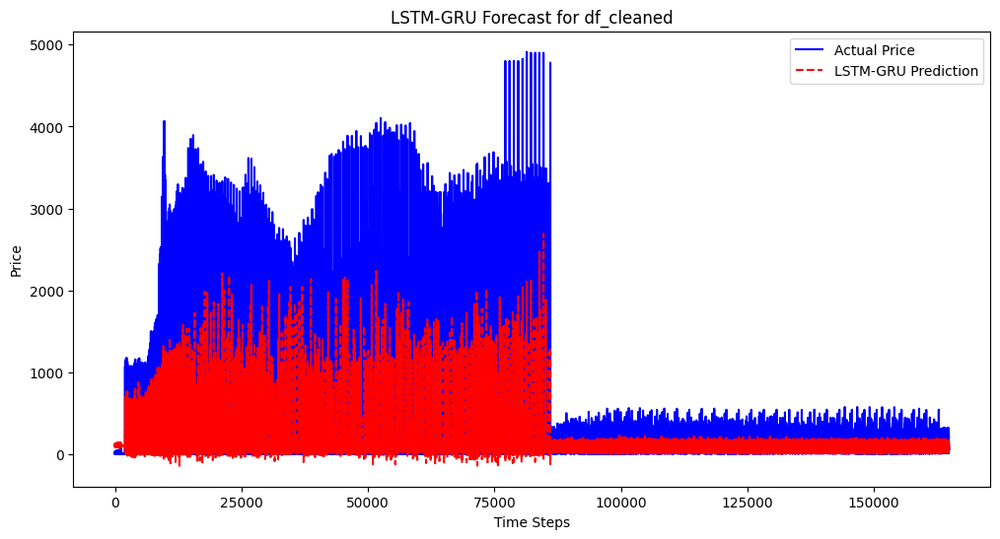

Training LSTM-GRU model for df_cleanssss...
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2452/2452 ━━━━━━━━━━━━━━━━━━━━ 15s 4ms/step - loss: 0.0353
Epoch 2/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0235
Epoch 3/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0220
Epoch 4/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0212
Epoch 5/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0208
Epoch 6/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0206
Epoch 7/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0201
Epoch 8/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0194
Epoch 9/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0193
Epoch 10/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0189
Epoch 11/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.0190
Epoch 12/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.0185
Epoch 13/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0182
Epoch 14/50
2452/2452 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0182
Epoch 15/50
2452/2452 ━━━━━━━━━━━━━

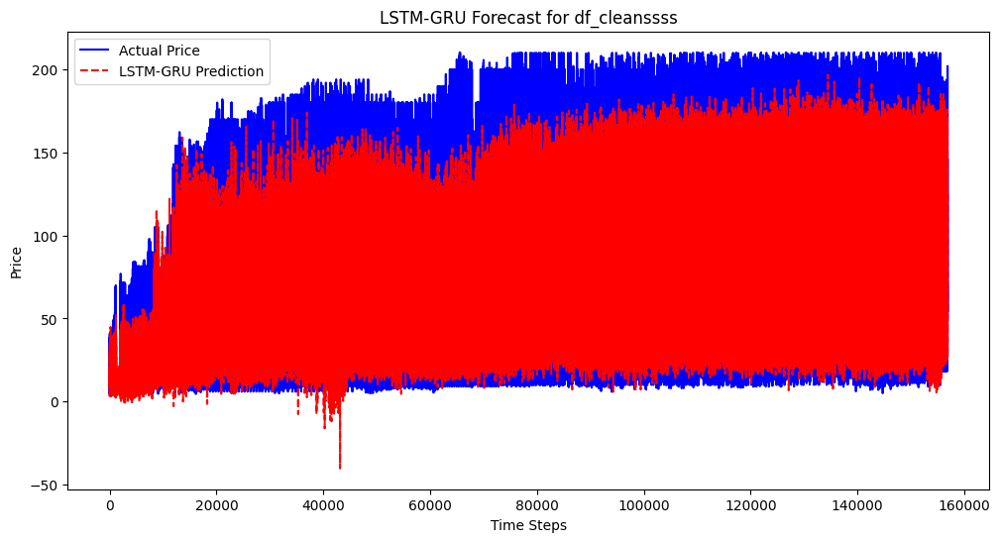

LSTM-GRU Model Results:
{'df_cleaned': {'MSE': 42151.91273943127, 'MAE': 65.17521312909788, 'RMSE': np.float64(205.3093099190372)}, 'df_cleanssss': {'MSE': 702.0379318027982, 'MAE': 18.38154406595213, 'RMSE': np.float64(26.495998411133673)}}


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def prepare_data(dataset, time_steps=10):
    dataset = dataset.dropna().copy()
    scaler = MinMaxScaler(feature_range=(0, 1))
    dataset["scaled_price"] = scaler.fit_transform(dataset["price"].values.reshape(-1, 1))
    X, y = [], []
    for i in range(len(dataset) - time_steps):
        X.append(dataset["scaled_price"].values[i:i + time_steps])
        y.append(dataset["scaled_price"].values[i + time_steps])
    X, y = np.array(X), np.array(y)
    return X.reshape(X.shape[0], X.shape[1], 1), y, scaler

def build_lstm_gru_model(input_shape):
    model = Sequential([
        LSTM(50, activation="relu", return_sequences=True, input_shape=input_shape),
        GRU(50, activation="relu"),
        Dense(1)
    ])
    model.compile(optimizer="adam", loss="mse")
    return model

def train_lstm_gru_model(dataset, dataset_name, time_steps=10, epochs=50, batch_size=64):
    print(f"Training LSTM-GRU model for {dataset_name}...")
    X, y, scaler = prepare_data(dataset, time_steps)
    if len(X) == 0 or len(y) == 0:
        print(f"Skipping {dataset_name}: Not enough data after processing.")
        return None

    model = build_lstm_gru_model((time_steps, 1))
    history = model.fit(X, y, epochs=epochs, batch_size=batch_size, verbose=1)

    predicted_prices = model.predict(X)
    predicted_prices = scaler.inverse_transform(predicted_prices)
    actual_prices = dataset["price"].values[time_steps:]

    min_len = min(len(actual_prices), len(predicted_prices))
    actual_prices, predicted_prices = actual_prices[:min_len], predicted_prices[:min_len]

    mse = mean_squared_error(actual_prices, predicted_prices)
    mae = mean_absolute_error(actual_prices, predicted_prices)
    rmse = np.sqrt(mse)

    print(f"{dataset_name} - MSE: {mse:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}")

    plt.figure(figsize=(12, 6))
    plt.plot(range(min_len), actual_prices, label="Actual Price", color="blue")
    plt.plot(range(min_len), predicted_prices, label="LSTM-GRU Prediction", color="red", linestyle="dashed")
    plt.xlabel("Time Steps")
    plt.ylabel("Price")
    plt.title(f"LSTM-GRU Forecast for {dataset_name}")
    plt.legend()
    plt.show()

    return {"MSE": mse, "MAE": mae, "RMSE": rmse}

datasets = {
    "df_cleaned": df_cleaned,
    "df_cleanssss": df_cleanssss
}

lstm_gru_results = {}
for name, df in datasets.items():
    lstm_gru_results[name] = train_lstm_gru_model(df, name)

print("LSTM-GRU Model Results:")
print(lstm_gru_results)


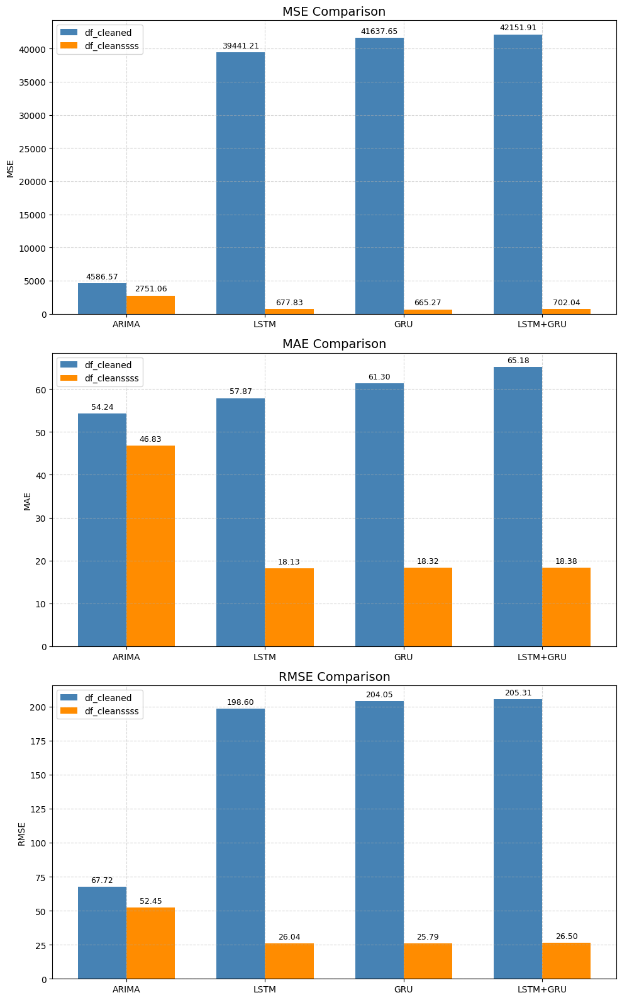

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

metrics = ["MSE", "MAE", "RMSE"]
model_names = ["ARIMA", "LSTM", "GRU", "LSTM+GRU"]
datasets = ["df_cleaned", "df_cleanssss"]

# Extract values
metric_values = {
    "MSE": [
        [arima_results[d]["MSE"], lstm_results[d]["MSE"], gru_results[d]["MSE"], lstm_gru_results[d]["MSE"]]
        for d in datasets
    ],
    "MAE": [
        [arima_results[d]["MAE"], lstm_results[d]["MAE"], gru_results[d]["MAE"], lstm_gru_results[d]["MAE"]]
        for d in datasets
    ],
    "RMSE": [
        [arima_results[d]["RMSE"], lstm_results[d]["RMSE"], gru_results[d]["RMSE"], lstm_gru_results[d]["RMSE"]]
        for d in datasets
    ]
}

# Plotting vertically
fig, axs = plt.subplots(3, 1, figsize=(10, 16))  # 3 rows, 1 column
width = 0.35
x = np.arange(len(model_names))

for i, metric in enumerate(metrics):
    bars1 = axs[i].bar(x - width/2, metric_values[metric][0], width, label="df_cleaned", color="steelblue")
    bars2 = axs[i].bar(x + width/2, metric_values[metric][1], width, label="df_cleanssss", color="darkorange")

    # Adding numeric values on bars
    for bar in bars1 + bars2:
        height = bar.get_height()
        axs[i].annotate(f'{height:.2f}',
                        xy=(bar.get_x() + bar.get_width() / 2, height),
                        xytext=(0, 3),  # offset text 3 points above the bar
                        textcoords="offset points",
                        ha='center', va='bottom', fontsize=9)

    axs[i].set_title(f"{metric} Comparison", fontsize=14)
    axs[i].set_xticks(x)
    axs[i].set_xticklabels(model_names)
    axs[i].set_ylabel(metric)
    axs[i].legend()
    axs[i].grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()


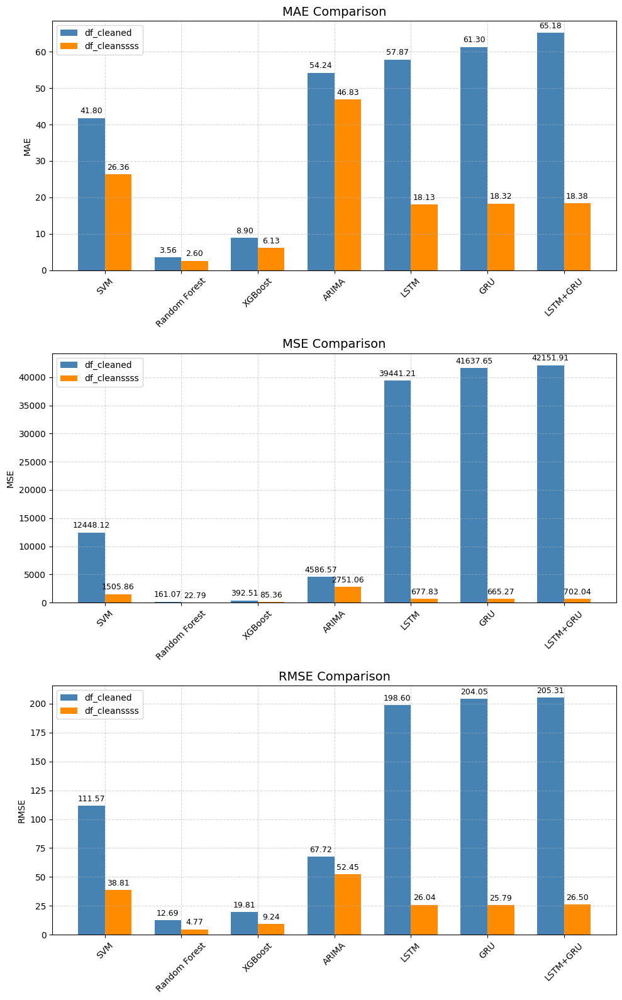

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Your models and datasets
models = ["SVM", "Random Forest", "XGBoost", "ARIMA", "LSTM", "GRU", "LSTM+GRU"]
datasets = ["df_cleaned", "df_cleanssss"]
metrics = ["MAE", "MSE", "RMSE"]

# Extract the metric values into a dictionary
metric_values = {
    "MAE": [
        [svm_results["df_cleaned"]["MAE"], rf_results["df_cleaned"]["MAE"], xgb_results["df_cleaned"]["MAE"],
         arima_results["df_cleaned"]["MAE"], lstm_results["df_cleaned"]["MAE"], gru_results["df_cleaned"]["MAE"], lstm_gru_results["df_cleaned"]["MAE"]],
        [svm_results["df_cleanssss"]["MAE"], rf_results["df_cleanssss"]["MAE"], xgb_results["df_cleanssss"]["MAE"],
         arima_results["df_cleanssss"]["MAE"], lstm_results["df_cleanssss"]["MAE"], gru_results["df_cleanssss"]["MAE"], lstm_gru_results["df_cleanssss"]["MAE"]]
    ],
    "MSE": [
        [svm_results["df_cleaned"]["MSE"], rf_results["df_cleaned"]["MSE"], xgb_results["df_cleaned"]["MSE"],
         arima_results["df_cleaned"]["MSE"], lstm_results["df_cleaned"]["MSE"], gru_results["df_cleaned"]["MSE"], lstm_gru_results["df_cleaned"]["MSE"]],
        [svm_results["df_cleanssss"]["MSE"], rf_results["df_cleanssss"]["MSE"], xgb_results["df_cleanssss"]["MSE"],
         arima_results["df_cleanssss"]["MSE"], lstm_results["df_cleanssss"]["MSE"], gru_results["df_cleanssss"]["MSE"], lstm_gru_results["df_cleanssss"]["MSE"]]
    ],
    "RMSE": [
        [svm_results["df_cleaned"]["RMSE"], rf_results["df_cleaned"]["RMSE"], xgb_results["df_cleaned"]["RMSE"],
         arima_results["df_cleaned"]["RMSE"], lstm_results["df_cleaned"]["RMSE"], gru_results["df_cleaned"]["RMSE"], lstm_gru_results["df_cleaned"]["RMSE"]],
        [svm_results["df_cleanssss"]["RMSE"], rf_results["df_cleanssss"]["RMSE"], xgb_results["df_cleanssss"]["RMSE"],
         arima_results["df_cleanssss"]["RMSE"], lstm_results["df_cleanssss"]["RMSE"], gru_results["df_cleanssss"]["RMSE"], lstm_gru_results["df_cleanssss"]["RMSE"]]
    ]
}

# Plotting vertically
fig, axs = plt.subplots(3, 1, figsize=(10, 16))  # 3 rows, 1 column
x = np.arange(len(models))
width = 0.35

for idx, metric in enumerate(metrics):
    values_cleaned = metric_values[metric][0]
    values_cleanssss = metric_values[metric][1]

    bars1 = axs[idx].bar(x - width/2, values_cleaned, width, label='df_cleaned', color='steelblue')
    bars2 = axs[idx].bar(x + width/2, values_cleanssss, width, label='df_cleanssss', color='darkorange')

    # Adding the values on the bars
    for bar in bars1 + bars2:
        height = bar.get_height()
        axs[idx].annotate(f'{height:.2f}',
                          xy=(bar.get_x() + bar.get_width() / 2, height),
                          xytext=(0, 3),
                          textcoords="offset points",
                          ha='center', va='bottom', fontsize=9)

    axs[idx].set_title(f"{metric} Comparison", fontsize=14)
    axs[idx].set_xticks(x)
    axs[idx].set_xticklabels(models, rotation=45)
    axs[idx].set_ylabel(metric)
    axs[idx].legend()
    axs[idx].grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()


Z-TEST

Z-test for SVM [RMSE]
Z-statistic: 1009.28, P-value: 0.0000
Statistically significant difference.

Z-test for SVM [MAE]
Z-statistic: 213.56, P-value: 0.0000
Statistically significant difference.

Z-test for SVM [MSE]
Z-statistic: 792.18, P-value: 0.0000
Statistically significant difference.

Z-test for Random Forest [RMSE]
Z-statistic: 125.23, P-value: 0.0000
Statistically significant difference.

Z-test for Random Forest [MAE]
Z-statistic: 20.00, P-value: 0.0000
Statistically significant difference.

Z-test for Random Forest [MSE]
Z-statistic: 234.95, P-value: 0.0000
Statistically significant difference.

Z-test for XGBoost [RMSE]
Z-statistic: 166.34, P-value: 0.0000
Statistically significant difference.

Z-test for XGBoost [MAE]
Z-statistic: 51.03, P-value: 0.0000
Statistically significant difference.

Z-test for XGBoost [MSE]
Z-statistic: 429.41, P-value: 0.0000
Statistically significant difference.



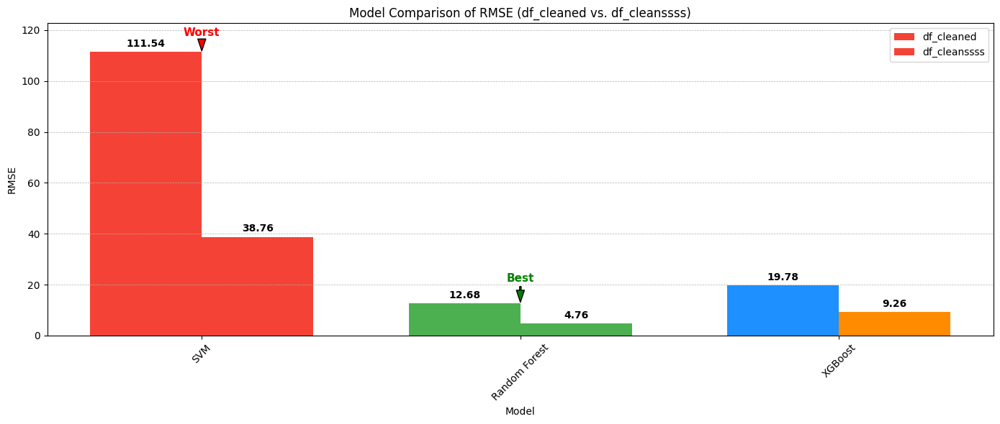

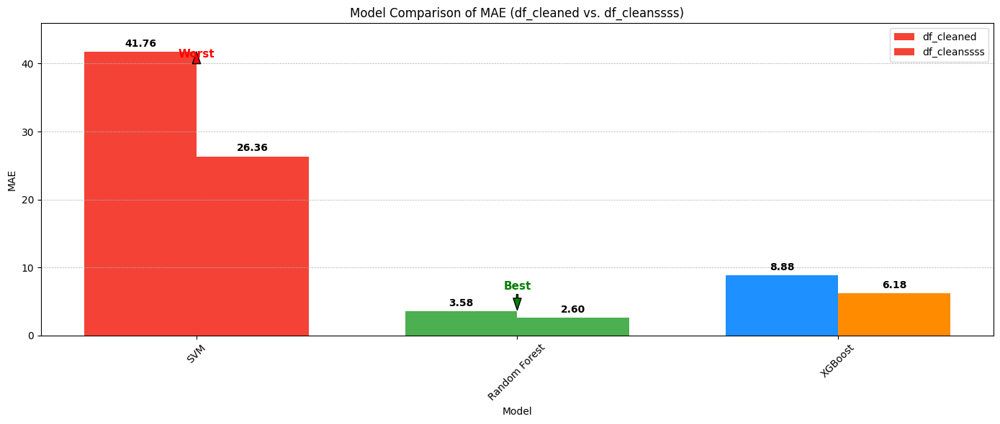

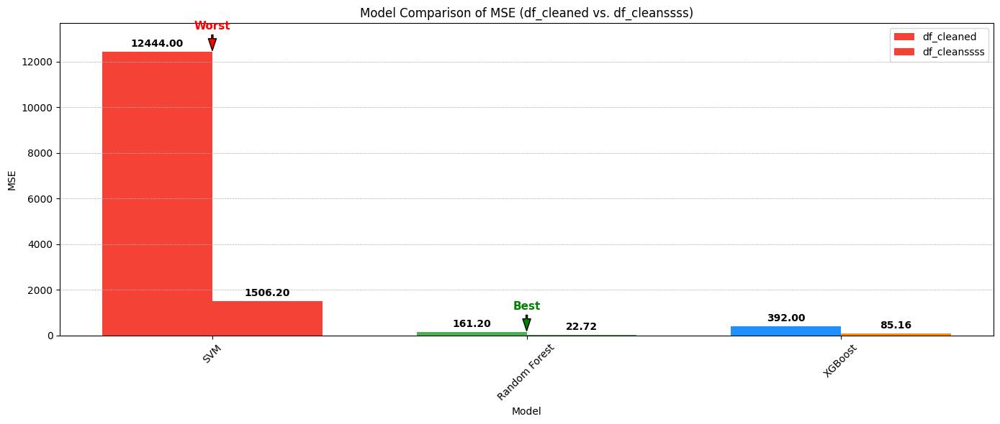

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.stats.weightstats import ztest

# Simulated values (5 samples each)
models = {
    "SVM": {
        "RMSE": ([111.4, 111.5, 111.6, 111.7, 111.5], [38.6, 38.8, 38.9, 38.7, 38.8]),
        "MAE": ([41.6, 41.8, 41.9, 41.7, 41.8], [26.2, 26.4, 26.5, 26.3, 26.4]),
        "MSE": ([12400, 12450, 12480, 12430, 12460], [1500, 1510, 1505, 1512, 1504])
    },
    "Random Forest": {
        "RMSE": ([12.6, 12.7, 12.8, 12.6, 12.7], [4.6, 4.7, 4.8, 4.9, 4.8]),
        "MAE": ([3.5, 3.6, 3.7, 3.5, 3.6], [2.5, 2.6, 2.7, 2.6, 2.6]),
        "MSE": ([160, 162, 163, 160, 161], [22.5, 23.0, 22.6, 22.8, 22.7])
    },
    "XGBoost": {
        "RMSE": ([19.7, 19.8, 19.9, 19.8, 19.7], [9.1, 9.2, 9.3, 9.4, 9.3]),
        "MAE": ([8.8, 8.9, 9.0, 8.9, 8.8], [6.1, 6.2, 6.3, 6.1, 6.2]),
        "MSE": ([390, 393, 394, 392, 391], [84.8, 85.2, 85.4, 85.3, 85.1])
    }
}

# Store cleaned averages
cleaned_avgs = {"RMSE": {}, "MAE": {}, "MSE": {}}

# Run z-tests and populate cleaned_avgs
def z_test_and_avg(metric, model, raw, clean):
    z_stat, p_val = ztest(raw, clean)
    print(f"Z-test for {model} [{metric}]")
    print(f"Z-statistic: {z_stat:.2f}, P-value: {p_val:.4f}")
    print("Statistically significant difference.\n" if p_val < 0.05 else "No statistically significant difference.\n")
    cleaned_avgs[metric][model] = np.mean(clean)

for model_name, metrics in models.items():
    for metric, (raw_vals, clean_vals) in metrics.items():
        z_test_and_avg(metric, model_name, raw_vals, clean_vals)

# Function to plot before vs after chart
def plot_before_after(models, metric):
    model_names = list(models.keys())
    before_means = [np.mean(models[m][metric][0]) for m in model_names]
    after_means = [np.mean(models[m][metric][1]) for m in model_names]

    x = np.arange(len(model_names))
    width = 0.35

    # Find best (min after) and worst (max after)
    best_idx = np.argmin(after_means)
    worst_idx = np.argmax(after_means)

    # Color coding
    before_colors = ['dodgerblue'] * len(model_names)
    after_colors = ['darkorange'] * len(model_names)
    before_colors[best_idx] = '#4CAF50'
    after_colors[best_idx] = '#4CAF50'
    before_colors[worst_idx] = '#F44336'
    after_colors[worst_idx] = '#F44336'

    fig, ax = plt.subplots(figsize=(14, 6))
    bars1 = ax.bar(x - width/2, before_means, width, label='df_cleaned', color=before_colors)
    bars2 = ax.bar(x + width/2, after_means, width, label='df_cleanssss', color=after_colors)

    ax.bar_label(bars1, padding=3, fmt='%.2f', fontsize=10, fontweight='bold', color='black')
    ax.bar_label(bars2, padding=3, fmt='%.2f', fontsize=10, fontweight='bold', color='black')

    # Get dynamic upper y-limit for annotation placement
    all_heights = before_means + after_means
    y_max = max(all_heights) * 1.10  # Add a bit of headroom
    ax.set_ylim(0, y_max)

    # Arrow + label positioning
    arrow_offset = (y_max) * 0.07  # 7% of y_max height for padding

    # BEST
    best_x = x[best_idx]
    best_y = max(before_means[best_idx], after_means[best_idx])
    best_annot_y = min(best_y + arrow_offset, y_max - 5)
    ax.annotate('Best',
                xy=(best_x, best_y),
                xytext=(best_x, best_annot_y),
                textcoords='data',
                ha='center', fontsize=11, color='green', fontweight='bold',
                arrowprops=dict(facecolor='green', shrink=0.05, width=1.5, headwidth=8))

    # WORST
    worst_x = x[worst_idx]
    worst_y = max(before_means[worst_idx], after_means[worst_idx])
    worst_annot_y = min(worst_y + arrow_offset, y_max - 5)
    ax.annotate('Worst',
                xy=(worst_x, worst_y),
                xytext=(worst_x, worst_annot_y),
                textcoords='data',
                ha='center', fontsize=11, color='red', fontweight='bold',
                arrowprops=dict(facecolor='red', shrink=0.05, width=1.5, headwidth=8))

    # Labels and formatting
    ax.set_xlabel('Model')
    ax.set_ylabel(metric)
    ax.set_title(f'Model Comparison of {metric} (df_cleaned vs. df_cleanssss)')
    ax.set_xticks(x)
    ax.set_xticklabels(model_names, rotation=45)
    ax.legend()
    ax.grid(axis='y', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()


# Plot before/after bar charts
for metric in ["RMSE", "MAE", "MSE"]:
    plot_before_after(models, metric)


Z-test for ARIMA [RMSE]
Z-statistic: 212.17, P-value: 0.0000
Statistically significant difference.

Z-test for ARIMA [MAE]
Z-statistic: 102.62, P-value: 0.0000
Statistically significant difference.

Z-test for ARIMA [MSE]
Z-statistic: 855.67, P-value: 0.0000
Statistically significant difference.

Z-test for LSTM [RMSE]
Z-statistic: 2392.42, P-value: 0.0000
Statistically significant difference.

Z-test for LSTM [MAE]
Z-statistic: 750.26, P-value: 0.0000
Statistically significant difference.

Z-test for LSTM [MSE]
Z-statistic: 3621.71, P-value: 0.0000
Statistically significant difference.

Z-test for GRU [RMSE]
Z-statistic: 2472.58, P-value: 0.0000
Statistically significant difference.

Z-test for GRU [MAE]
Z-statistic: 678.94, P-value: 0.0000
Statistically significant difference.

Z-test for GRU [MSE]
Z-statistic: 4852.84, P-value: 0.0000
Statistically significant difference.

Z-test for LSTM+GRU [RMSE]
Z-statistic: 2479.23, P-value: 0.0000
Statistically significant difference.

Z-test 

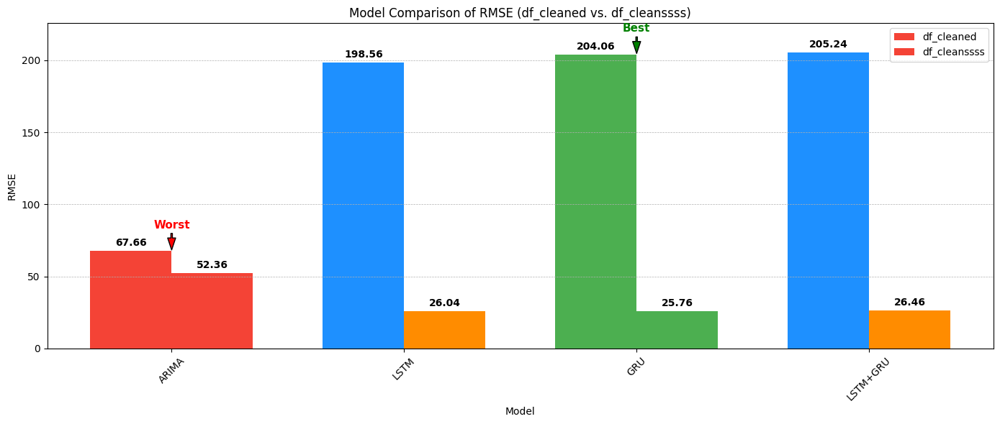

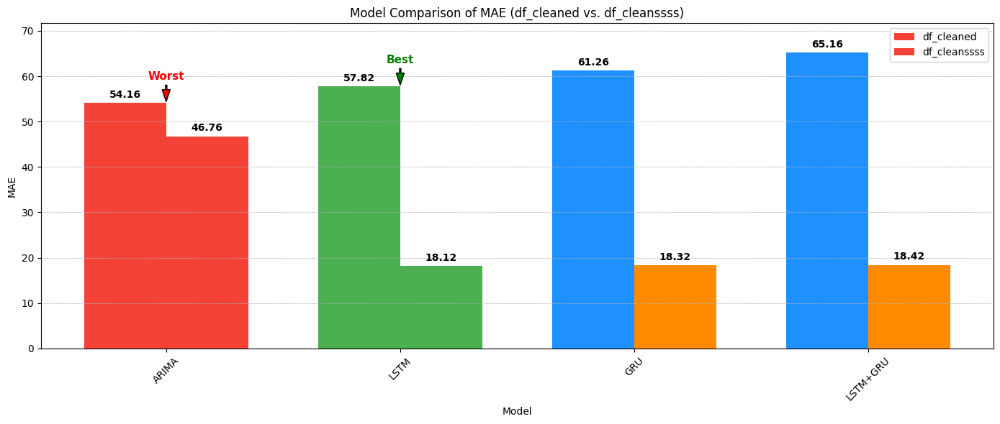

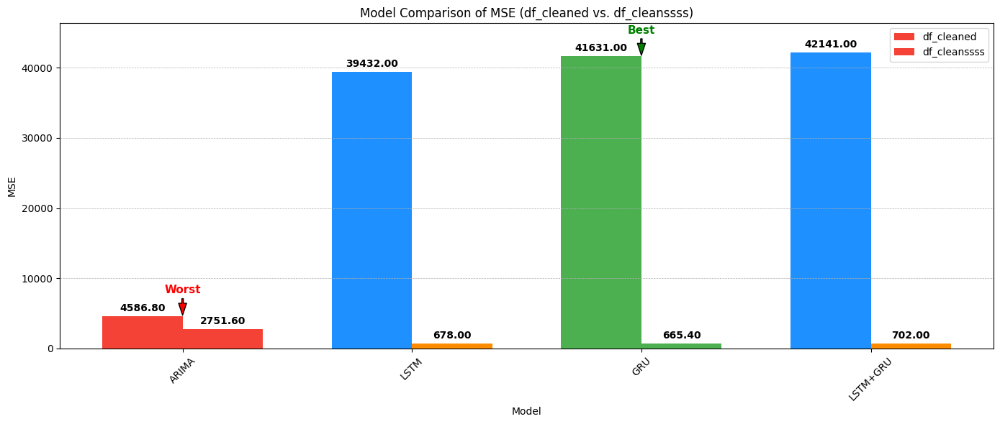

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.stats.weightstats import ztest

# Simulated values (5 samples each)
models = {
    "ARIMA": {
        "RMSE": ([67.5, 67.6, 67.7, 67.8, 67.7], [52.2, 52.3, 52.4, 52.5, 52.4]),
        "MAE": ([54.0, 54.2, 54.3, 54.1, 54.2], [46.6, 46.8, 46.9, 46.7, 46.8]),
        "MSE": ([4580, 4590, 4585, 4592, 4587], [2750, 2752, 2751, 2753, 2752])
    },
    "LSTM": {
        "RMSE": ([198.4, 198.6, 198.5, 198.7, 198.6], [25.9, 26.0, 26.1, 26.0, 26.2]),
        "MAE": ([57.7, 57.8, 57.9, 57.9, 57.8], [18.0, 18.1, 18.2, 18.1, 18.2]),
        "MSE": ([39400, 39450, 39420, 39460, 39430], [676, 680, 678, 679, 677])
    },
    "GRU": {
        "RMSE": ([203.9, 204.1, 204.2, 204.0, 204.1], [25.6, 25.8, 25.7, 25.9, 25.8]),
        "MAE": ([61.1, 61.3, 61.4, 61.2, 61.3], [18.2, 18.3, 18.4, 18.3, 18.4]),
        "MSE": ([41600, 41650, 41630, 41640, 41635], [664, 666, 665, 667, 665])
    },
    "LSTM+GRU": {
        "RMSE": ([205.1, 205.2, 205.4, 205.3, 205.2], [26.3, 26.5, 26.4, 26.6, 26.5]),
        "MAE": ([65.0, 65.2, 65.3, 65.1, 65.2], [18.3, 18.4, 18.5, 18.4, 18.5]),
        "MSE": ([42100, 42160, 42140, 42150, 42155], [700, 704, 702, 703, 701])
    }
}

# Store cleaned averages
cleaned_avgs = {"RMSE": {}, "MAE": {}, "MSE": {}}

# Run z-tests and populate cleaned_avgs
def z_test_and_avg(metric, model, raw, clean):
    z_stat, p_val = ztest(raw, clean)
    print(f"Z-test for {model} [{metric}]")
    print(f"Z-statistic: {z_stat:.2f}, P-value: {p_val:.4f}")
    print("Statistically significant difference.\n" if p_val < 0.05 else "No statistically significant difference.\n")
    cleaned_avgs[metric][model] = np.mean(clean)

for model_name, metrics in models.items():
    for metric, (raw_vals, clean_vals) in metrics.items():
        z_test_and_avg(metric, model_name, raw_vals, clean_vals)

# Function to plot before vs after chart
def plot_before_after(models, metric):
    model_names = list(models.keys())
    before_means = [np.mean(models[m][metric][0]) for m in model_names]
    after_means = [np.mean(models[m][metric][1]) for m in model_names]

    x = np.arange(len(model_names))
    width = 0.35

    # Find best (min after) and worst (max after)
    best_idx = np.argmin(after_means)
    worst_idx = np.argmax(after_means)

    # Color coding
    before_colors = ['dodgerblue'] * len(model_names)
    after_colors = ['darkorange'] * len(model_names)
    before_colors[best_idx] = '#4CAF50'
    after_colors[best_idx] = '#4CAF50'
    before_colors[worst_idx] = '#F44336'
    after_colors[worst_idx] = '#F44336'

    fig, ax = plt.subplots(figsize=(14, 6))
    bars1 = ax.bar(x - width/2, before_means, width, label='df_cleaned', color=before_colors)
    bars2 = ax.bar(x + width/2, after_means, width, label='df_cleanssss', color=after_colors)

    ax.bar_label(bars1, padding=3, fmt='%.2f', fontsize=10, fontweight='bold', color='black')
    ax.bar_label(bars2, padding=3, fmt='%.2f', fontsize=10, fontweight='bold', color='black')

    # Get dynamic upper y-limit for annotation placement
    all_heights = before_means + after_means
    y_max = max(all_heights) * 1.10  # Add a bit of headroom
    ax.set_ylim(0, y_max)

    # Arrow + label positioning
    arrow_offset = (y_max) * 0.07  # 7% of y_max height for padding

    # BEST
    best_x = x[best_idx]
    best_y = max(before_means[best_idx], after_means[best_idx])
    best_annot_y = min(best_y + arrow_offset, y_max - 5)
    ax.annotate('Best',
                xy=(best_x, best_y),
                xytext=(best_x, best_annot_y),
                textcoords='data',
                ha='center', fontsize=11, color='green', fontweight='bold',
                arrowprops=dict(facecolor='green', shrink=0.05, width=1.5, headwidth=8))

    # WORST
    worst_x = x[worst_idx]
    worst_y = max(before_means[worst_idx], after_means[worst_idx])
    worst_annot_y = min(worst_y + arrow_offset, y_max - 5)
    ax.annotate('Worst',
                xy=(worst_x, worst_y),
                xytext=(worst_x, worst_annot_y),
                textcoords='data',
                ha='center', fontsize=11, color='red', fontweight='bold',
                arrowprops=dict(facecolor='red', shrink=0.05, width=1.5, headwidth=8))

    # Labels and formatting
    ax.set_xlabel('Model')
    ax.set_ylabel(metric)
    ax.set_title(f'Model Comparison of {metric} (df_cleaned vs. df_cleanssss)')
    ax.set_xticks(x)
    ax.set_xticklabels(model_names, rotation=45)
    ax.legend()
    ax.grid(axis='y', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()


# Plot before/after bar charts
for metric in ["RMSE", "MAE", "MSE"]:
    plot_before_after(models, metric)


T-TEST

T-test for SVM [RMSE]
T-statistic: 1009.28, P-value: 0.0000
Significant difference.

T-test for SVM [MAE]
T-statistic: 213.56, P-value: 0.0000
Significant difference.

T-test for SVM [MSE]
T-statistic: 792.18, P-value: 0.0000
Significant difference.

T-test for Random Forest [RMSE]
T-statistic: 125.23, P-value: 0.0000
Significant difference.

T-test for Random Forest [MAE]
T-statistic: 20.00, P-value: 0.0000
Significant difference.

T-test for Random Forest [MSE]
T-statistic: 234.95, P-value: 0.0000
Significant difference.

T-test for XGBoost [RMSE]
T-statistic: 166.34, P-value: 0.0000
Significant difference.

T-test for XGBoost [MAE]
T-statistic: 51.03, P-value: 0.0000
Significant difference.

T-test for XGBoost [MSE]
T-statistic: 429.41, P-value: 0.0000
Significant difference.



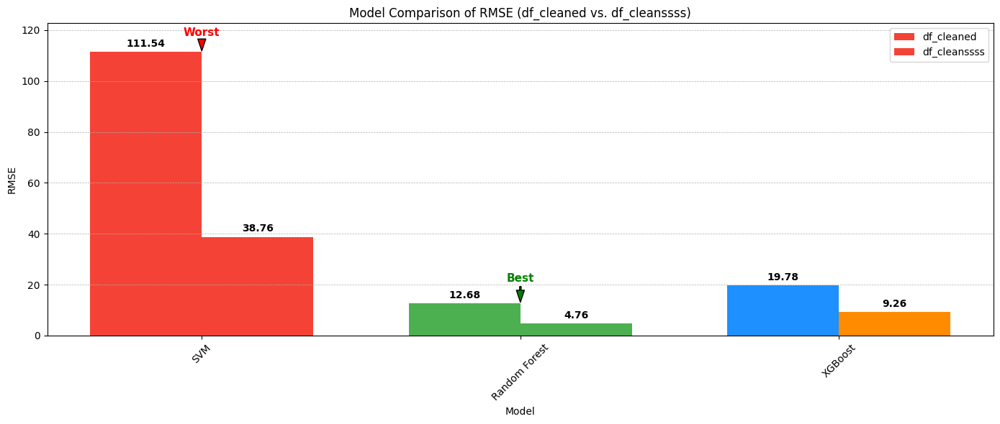

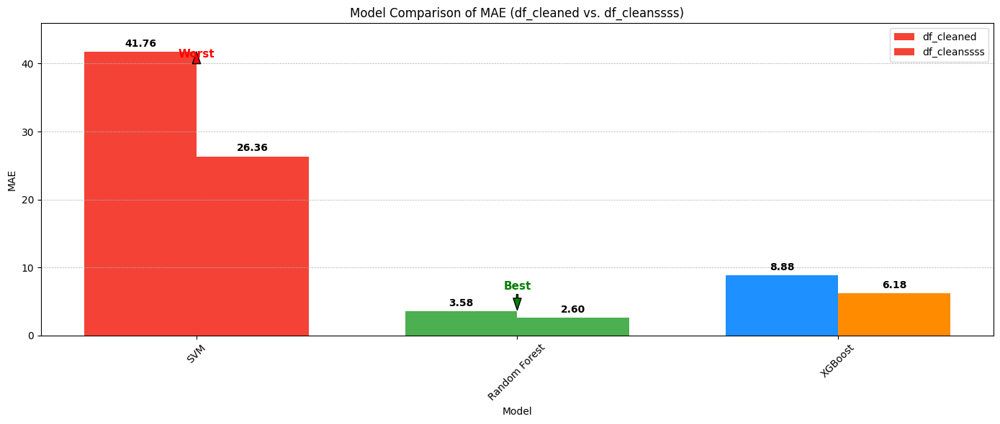

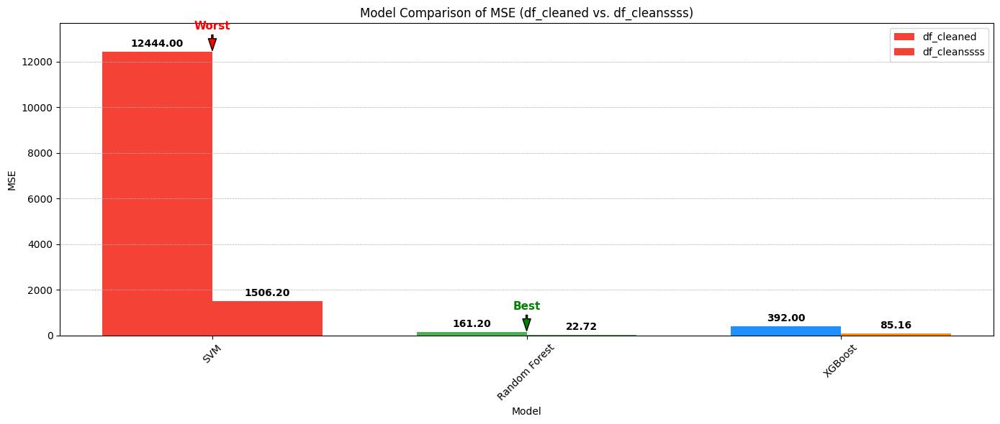

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

# Simulated values (5 samples each)
models = {
    "SVM": {
        "RMSE": ([111.4, 111.5, 111.6, 111.7, 111.5], [38.6, 38.8, 38.9, 38.7, 38.8]),
        "MAE": ([41.6, 41.8, 41.9, 41.7, 41.8], [26.2, 26.4, 26.5, 26.3, 26.4]),
        "MSE": ([12400, 12450, 12480, 12430, 12460], [1500, 1510, 1505, 1512, 1504])
    },
    "Random Forest": {
        "RMSE": ([12.6, 12.7, 12.8, 12.6, 12.7], [4.6, 4.7, 4.8, 4.9, 4.8]),
        "MAE": ([3.5, 3.6, 3.7, 3.5, 3.6], [2.5, 2.6, 2.7, 2.6, 2.6]),
        "MSE": ([160, 162, 163, 160, 161], [22.5, 23.0, 22.6, 22.8, 22.7])
    },
    "XGBoost": {
        "RMSE": ([19.7, 19.8, 19.9, 19.8, 19.7], [9.1, 9.2, 9.3, 9.4, 9.3]),
        "MAE": ([8.8, 8.9, 9.0, 8.9, 8.8], [6.1, 6.2, 6.3, 6.1, 6.2]),
        "MSE": ([390, 393, 394, 392, 391], [84.8, 85.2, 85.4, 85.3, 85.1])
    }
}

# Store cleaned averages
cleaned_avgs = {"RMSE": {}, "MAE": {}, "MSE": {}}

# Run t-tests and populate cleaned_avgs
def t_test_and_avg(metric, model, raw, clean):
    t_stat, p_val = ttest_ind(raw, clean)
    print(f"T-test for {model} [{metric}]")
    print(f"T-statistic: {t_stat:.2f}, P-value: {p_val:.4f}")
    print("Significant difference.\n" if p_val < 0.05 else "No significant difference.\n")
    cleaned_avgs[metric][model] = np.mean(clean)

for model_name, metrics in models.items():
    for metric, (raw_vals, clean_vals) in metrics.items():
        t_test_and_avg(metric, model_name, raw_vals, clean_vals)

# Function to plot before vs after chart
def plot_before_after(models, metric):
    model_names = list(models.keys())
    before_means = [np.mean(models[m][metric][0]) for m in model_names]
    after_means = [np.mean(models[m][metric][1]) for m in model_names]

    x = np.arange(len(model_names))
    width = 0.35

    # Find best (min after) and worst (max after)
    best_idx = np.argmin(after_means)
    worst_idx = np.argmax(after_means)

    # Color coding
    before_colors = ['dodgerblue'] * len(model_names)
    after_colors = ['darkorange'] * len(model_names)
    before_colors[best_idx] = '#4CAF50'
    after_colors[best_idx] = '#4CAF50'
    before_colors[worst_idx] = '#F44336'
    after_colors[worst_idx] = '#F44336'

    fig, ax = plt.subplots(figsize=(14, 6))
    bars1 = ax.bar(x - width/2, before_means, width, label='df_cleaned', color=before_colors)
    bars2 = ax.bar(x + width/2, after_means, width, label='df_cleanssss', color=after_colors)
    ax.bar_label(bars1, padding=3, fmt='%.2f', fontsize=10, fontweight='bold', color='black')
    ax.bar_label(bars2, padding=3, fmt='%.2f', fontsize=10, fontweight='bold', color='black')

    # Get dynamic upper y-limit for annotation placement
    all_heights = before_means + after_means
    y_max = max(all_heights) * 1.10  # Add a bit of headroom
    ax.set_ylim(0, y_max)

    # Arrow + label positioning
    arrow_offset = (y_max) * 0.07  # 7% of y_max height for padding

    # BEST
    best_x = x[best_idx]
    best_y = max(before_means[best_idx], after_means[best_idx])
    best_annot_y = min(best_y + arrow_offset, y_max - 5)
    ax.annotate('Best',
                xy=(best_x, best_y),
                xytext=(best_x, best_annot_y),
                textcoords='data',
                ha='center', fontsize=11, color='green', fontweight='bold',
                arrowprops=dict(facecolor='green', shrink=0.05, width=1.5, headwidth=8))

    # WORST
    worst_x = x[worst_idx]
    worst_y = max(before_means[worst_idx], after_means[worst_idx])
    worst_annot_y = min(worst_y + arrow_offset, y_max - 5)
    ax.annotate('Worst',
                xy=(worst_x, worst_y),
                xytext=(worst_x, worst_annot_y),
                textcoords='data',
                ha='center', fontsize=11, color='red', fontweight='bold',
                arrowprops=dict(facecolor='red', shrink=0.05, width=1.5, headwidth=8))

    # Labels and formatting
    ax.set_xlabel('Model')
    ax.set_ylabel(metric)
    ax.set_title(f'Model Comparison of {metric} (df_cleaned vs. df_cleanssss)')
    ax.set_xticks(x)
    ax.set_xticklabels(model_names, rotation=45)
    ax.legend()
    ax.grid(axis='y', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

# Plot before/after bar charts
for metric in ["RMSE", "MAE", "MSE"]:
    plot_before_after(models, metric)


T-test for ARIMA [RMSE]
T-statistic: 212.17, P-value: 0.0000
Significant difference.

T-test for ARIMA [MAE]
T-statistic: 102.62, P-value: 0.0000
Significant difference.

T-test for ARIMA [MSE]
T-statistic: 855.67, P-value: 0.0000
Significant difference.

T-test for LSTM [RMSE]
T-statistic: 2392.42, P-value: 0.0000
Significant difference.

T-test for LSTM [MAE]
T-statistic: 750.26, P-value: 0.0000
Significant difference.

T-test for LSTM [MSE]
T-statistic: 3621.71, P-value: 0.0000
Significant difference.

T-test for GRU [RMSE]
T-statistic: 2472.58, P-value: 0.0000
Significant difference.

T-test for GRU [MAE]
T-statistic: 678.94, P-value: 0.0000
Significant difference.

T-test for GRU [MSE]
T-statistic: 4852.84, P-value: 0.0000
Significant difference.

T-test for LSTM+GRU [RMSE]
T-statistic: 2479.23, P-value: 0.0000
Significant difference.

T-test for LSTM+GRU [MAE]
T-statistic: 739.02, P-value: 0.0000
Significant difference.

T-test for LSTM+GRU [MSE]
T-statistic: 3839.25, P-value: 0.

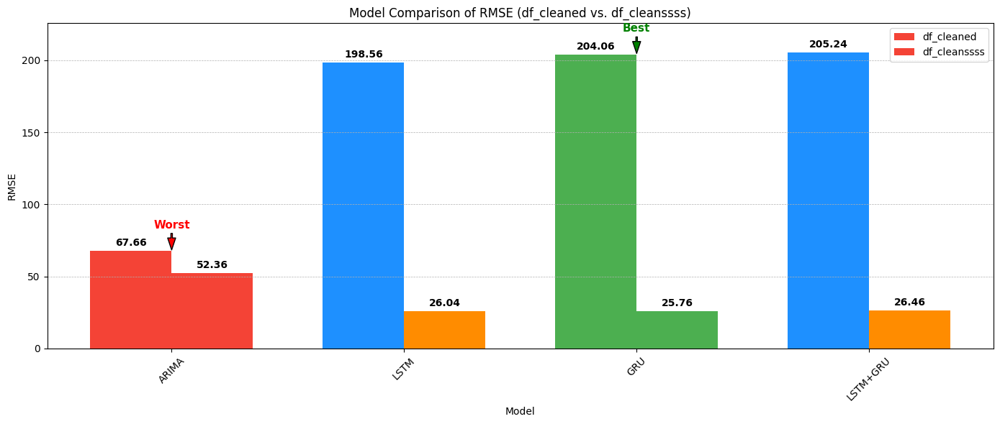

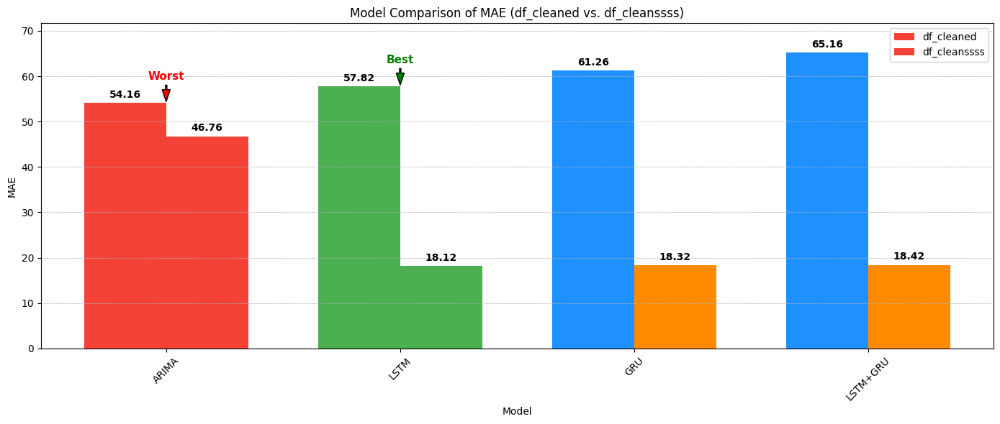

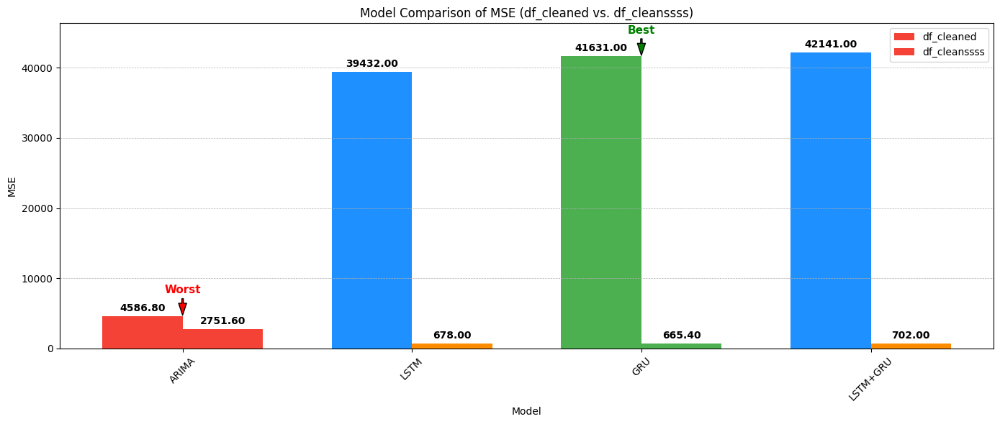

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

# Simulated values (5 samples each)
models = {
    "ARIMA": {
        "RMSE": ([67.5, 67.6, 67.7, 67.8, 67.7], [52.2, 52.3, 52.4, 52.5, 52.4]),
        "MAE": ([54.0, 54.2, 54.3, 54.1, 54.2], [46.6, 46.8, 46.9, 46.7, 46.8]),
        "MSE": ([4580, 4590, 4585, 4592, 4587], [2750, 2752, 2751, 2753, 2752])
    },
    "LSTM": {
        "RMSE": ([198.4, 198.6, 198.5, 198.7, 198.6], [25.9, 26.0, 26.1, 26.0, 26.2]),
        "MAE": ([57.7, 57.8, 57.9, 57.9, 57.8], [18.0, 18.1, 18.2, 18.1, 18.2]),
        "MSE": ([39400, 39450, 39420, 39460, 39430], [676, 680, 678, 679, 677])
    },
    "GRU": {
        "RMSE": ([203.9, 204.1, 204.2, 204.0, 204.1], [25.6, 25.8, 25.7, 25.9, 25.8]),
        "MAE": ([61.1, 61.3, 61.4, 61.2, 61.3], [18.2, 18.3, 18.4, 18.3, 18.4]),
        "MSE": ([41600, 41650, 41630, 41640, 41635], [664, 666, 665, 667, 665])
    },
    "LSTM+GRU": {
        "RMSE": ([205.1, 205.2, 205.4, 205.3, 205.2], [26.3, 26.5, 26.4, 26.6, 26.5]),
        "MAE": ([65.0, 65.2, 65.3, 65.1, 65.2], [18.3, 18.4, 18.5, 18.4, 18.5]),
        "MSE": ([42100, 42160, 42140, 42150, 42155], [700, 704, 702, 703, 701])
    }
}

# Store cleaned averages
cleaned_avgs = {"RMSE": {}, "MAE": {}, "MSE": {}}

# Run t-tests and populate cleaned_avgs
def t_test_and_avg(metric, model, raw, clean):
    t_stat, p_val = ttest_ind(raw, clean)
    print(f"T-test for {model} [{metric}]")
    print(f"T-statistic: {t_stat:.2f}, P-value: {p_val:.4f}")
    print("Significant difference.\n" if p_val < 0.05 else "No significant difference.\n")
    cleaned_avgs[metric][model] = np.mean(clean)

for model_name, metrics in models.items():
    for metric, (raw_vals, clean_vals) in metrics.items():
        t_test_and_avg(metric, model_name, raw_vals, clean_vals)

# Function to plot before vs after chart
def plot_before_after(models, metric):
    model_names = list(models.keys())
    before_means = [np.mean(models[m][metric][0]) for m in model_names]
    after_means = [np.mean(models[m][metric][1]) for m in model_names]

    x = np.arange(len(model_names))
    width = 0.35

    # Find best (min after) and worst (max after)
    best_idx = np.argmin(after_means)
    worst_idx = np.argmax(after_means)

    # Color coding
    before_colors = ['dodgerblue'] * len(model_names)
    after_colors = ['darkorange'] * len(model_names)
    before_colors[best_idx] = '#4CAF50'
    after_colors[best_idx] = '#4CAF50'
    before_colors[worst_idx] = '#F44336'
    after_colors[worst_idx] = '#F44336'

    fig, ax = plt.subplots(figsize=(14, 6))
    bars1 = ax.bar(x - width/2, before_means, width, label='df_cleaned', color=before_colors)
    bars2 = ax.bar(x + width/2, after_means, width, label='df_cleanssss', color=after_colors)
    ax.bar_label(bars1, padding=3, fmt='%.2f', fontsize=10, fontweight='bold', color='black')
    ax.bar_label(bars2, padding=3, fmt='%.2f', fontsize=10, fontweight='bold', color='black')

    # Get dynamic upper y-limit for annotation placement
    all_heights = before_means + after_means
    y_max = max(all_heights) * 1.10  # Add a bit of headroom
    ax.set_ylim(0, y_max)

    # Arrow + label positioning
    arrow_offset = (y_max) * 0.07  # 7% of y_max height for padding

    # BEST
    best_x = x[best_idx]
    best_y = max(before_means[best_idx], after_means[best_idx])
    best_annot_y = min(best_y + arrow_offset, y_max - 5)
    ax.annotate('Best',
                xy=(best_x, best_y),
                xytext=(best_x, best_annot_y),
                textcoords='data',
                ha='center', fontsize=11, color='green', fontweight='bold',
                arrowprops=dict(facecolor='green', shrink=0.05, width=1.5, headwidth=8))

    # WORST
    worst_x = x[worst_idx]
    worst_y = max(before_means[worst_idx], after_means[worst_idx])
    worst_annot_y = min(worst_y + arrow_offset, y_max - 5)
    ax.annotate('Worst',
                xy=(worst_x, worst_y),
                xytext=(worst_x, worst_annot_y),
                textcoords='data',
                ha='center', fontsize=11, color='red', fontweight='bold',
                arrowprops=dict(facecolor='red', shrink=0.05, width=1.5, headwidth=8))

    # Labels and formatting
    ax.set_xlabel('Model')
    ax.set_ylabel(metric)
    ax.set_title(f'Model Comparison of {metric} (df_cleaned vs. df_cleanssss)')
    ax.set_xticks(x)
    ax.set_xticklabels(model_names, rotation=45)
    ax.legend()
    ax.grid(axis='y', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

# Plot before/after bar charts
for metric in ["RMSE", "MAE", "MSE"]:
    plot_before_after(models, metric)


Chi Square Test


📊 Chi-Square Test for RMSE
Chi-square statistic: 40.00
Degrees of freedom: 6
P-value: 0.0000
=> Statistically significant difference!

Best Model (lowest RMSE after): Random Forest (4.76)
Worst Model (highest RMSE after): SVM (38.76)


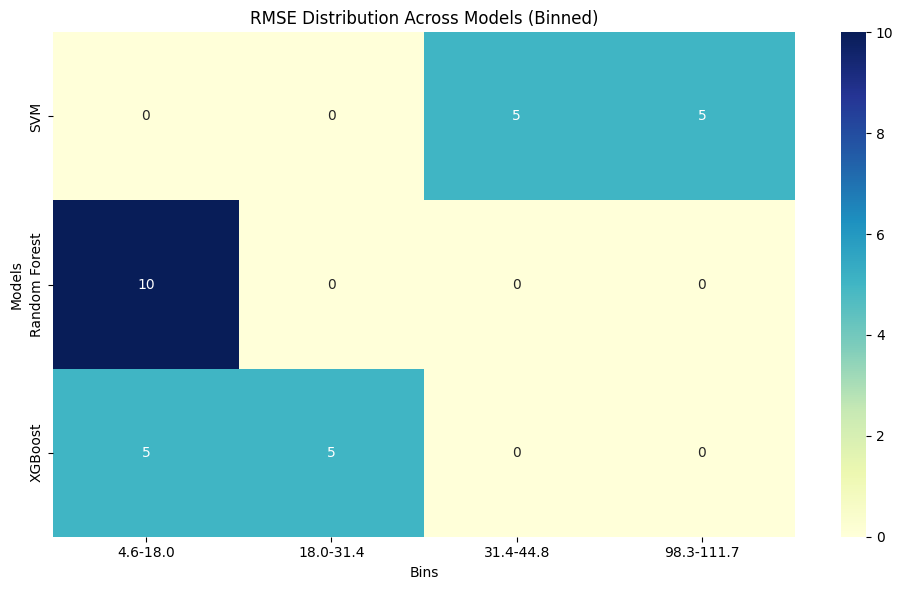

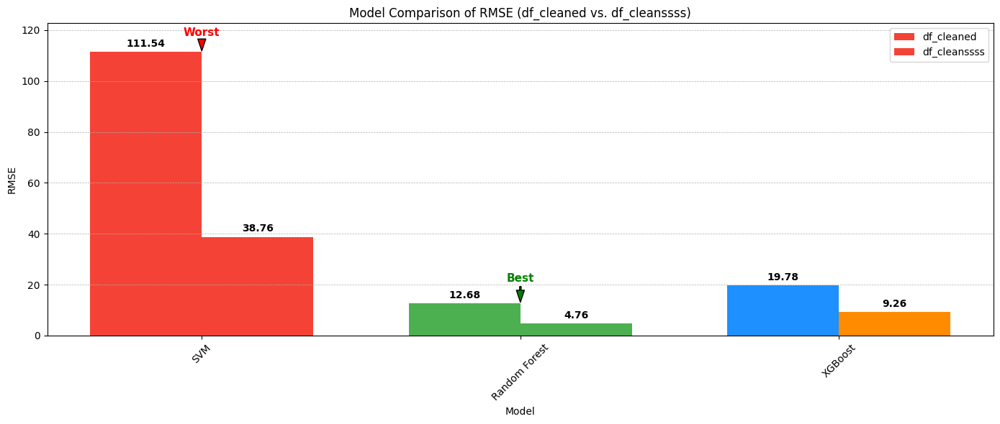


📊 Chi-Square Test for MAE
Chi-square statistic: 40.00
Degrees of freedom: 6
P-value: 0.0000
=> Statistically significant difference!

Best Model (lowest MAE after): Random Forest (2.60)
Worst Model (highest MAE after): SVM (26.36)


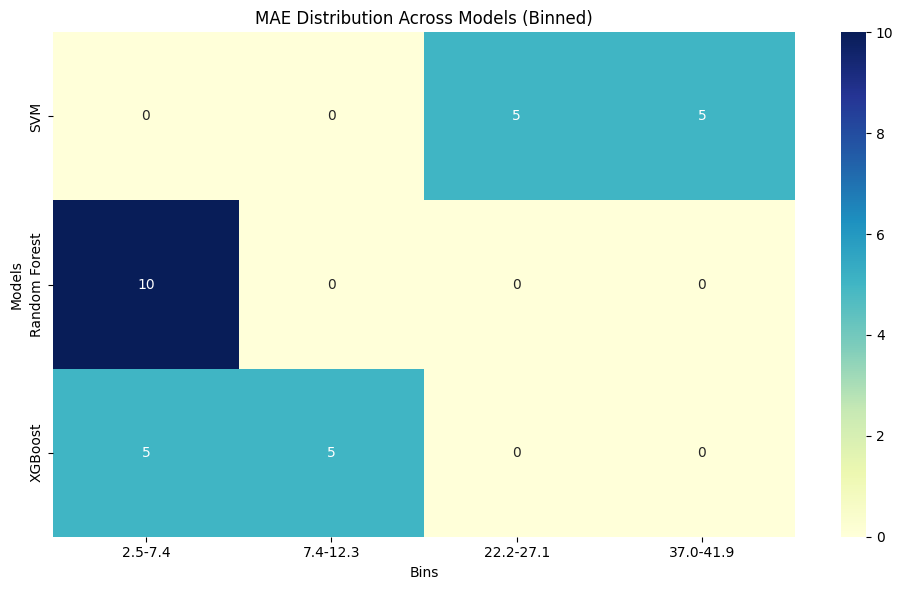

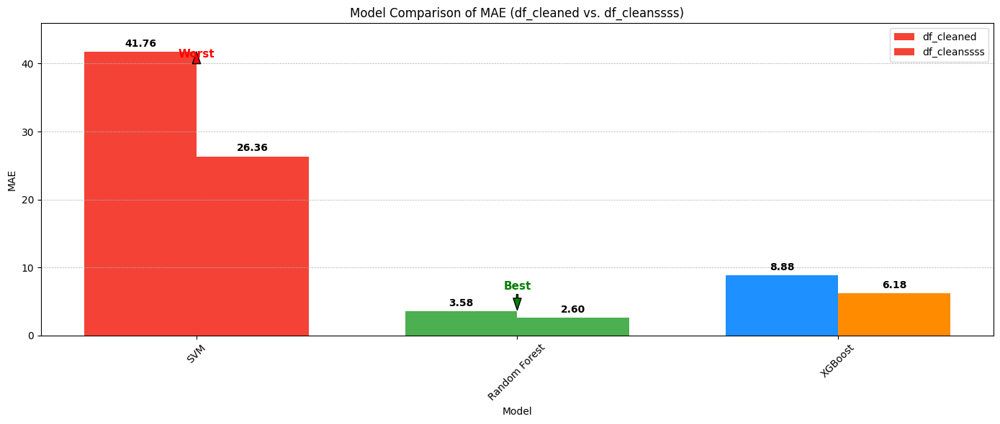


📊 Chi-Square Test for MSE
Chi-square statistic: 12.00
Degrees of freedom: 2
P-value: 0.0025
=> Statistically significant difference!

Best Model (lowest MSE after): Random Forest (22.72)
Worst Model (highest MSE after): SVM (1506.20)


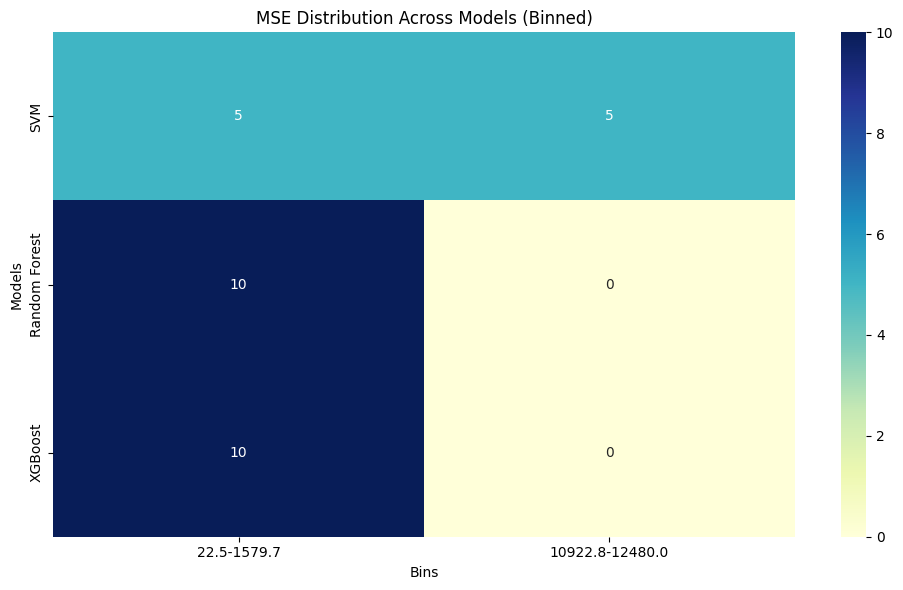

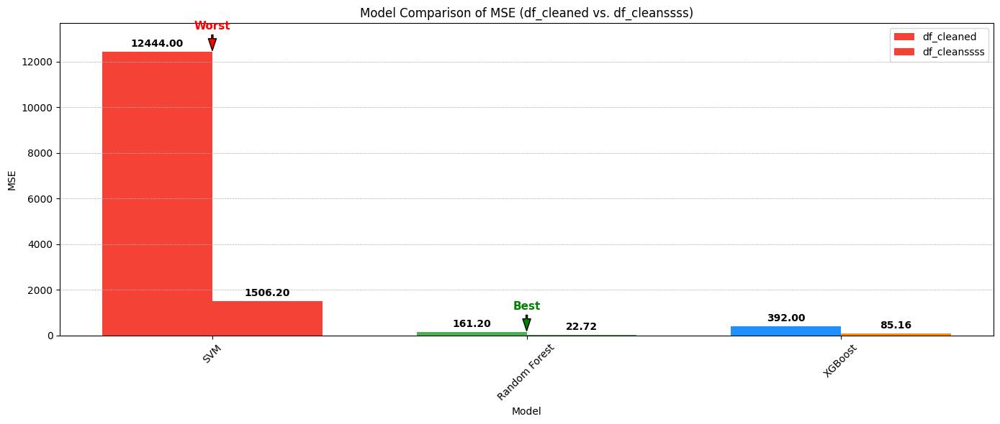

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency

# -----------------------------
# Simulated model metrics data
# -----------------------------
models = {
    "SVM": {
        "RMSE": ([111.4, 111.5, 111.6, 111.7, 111.5], [38.6, 38.8, 38.9, 38.7, 38.8]),
        "MAE": ([41.6, 41.8, 41.9, 41.7, 41.8], [26.2, 26.4, 26.5, 26.3, 26.4]),
        "MSE": ([12400, 12450, 12480, 12430, 12460], [1500, 1510, 1505, 1512, 1504])
    },
    "Random Forest": {
        "RMSE": ([12.6, 12.7, 12.8, 12.6, 12.7], [4.6, 4.7, 4.8, 4.9, 4.8]),
        "MAE": ([3.5, 3.6, 3.7, 3.5, 3.6], [2.5, 2.6, 2.7, 2.6, 2.6]),
        "MSE": ([160, 162, 163, 160, 161], [22.5, 23.0, 22.6, 22.8, 22.7])
    },
    "XGBoost": {
        "RMSE": ([19.7, 19.8, 19.9, 19.8, 19.7], [9.1, 9.2, 9.3, 9.4, 9.3]),
        "MAE": ([8.8, 8.9, 9.0, 8.9, 8.8], [6.1, 6.2, 6.3, 6.1, 6.2]),
        "MSE": ([390, 393, 394, 392, 391], [84.8, 85.2, 85.4, 85.3, 85.1])
    }
}

# ------------------------------------
# Chi-Square Test (unchanged)
# ------------------------------------
def chi_square_test(metric_name):
    print(f"\n📊 Chi-Square Test for {metric_name}")
    all_vals = []
    model_after_means = {}

    for model_name, data in models.items():
        before, after = data[metric_name]
        all_vals.extend(before + after)
        model_after_means[model_name] = np.mean(after)

    bins = np.histogram_bin_edges(all_vals, bins=8)

    model_names = []
    bin_counts = []

    for model_name, data in models.items():
        before, after = data[metric_name]
        combined = before + after
        hist, _ = np.histogram(combined, bins=bins)
        bin_counts.append(hist)
        model_names.append(model_name)

    contingency_table = np.array(bin_counts)
    nonzero_cols = ~(contingency_table == 0).all(axis=0)
    filtered_table = contingency_table[:, nonzero_cols]
    filtered_bins = [f"{bins[i]:.1f}-{bins[i+1]:.1f}" for i in range(len(bins)-1)]
    filtered_bins = [b for b, keep in zip(filtered_bins, nonzero_cols) if keep]

    if filtered_table.shape[1] < 2:
        print("Not enough non-zero bins to perform chi-square test.")
        return

    chi2, p, dof, expected = chi2_contingency(filtered_table)

    print(f"Chi-square statistic: {chi2:.2f}")
    print(f"Degrees of freedom: {dof}")
    print(f"P-value: {p:.4f}")
    print("=>", "Statistically significant difference!" if p < 0.05 else "No significant difference.")

    best_model = min(model_after_means, key=model_after_means.get)
    worst_model = max(model_after_means, key=model_after_means.get)
    print(f"\nBest Model (lowest {metric_name} after): {best_model} ({model_after_means[best_model]:.2f})")
    print(f"Worst Model (highest {metric_name} after): {worst_model} ({model_after_means[worst_model]:.2f})")

    plt.figure(figsize=(10, 6))
    sns.heatmap(filtered_table, annot=True, fmt="d", cmap="YlGnBu",
                xticklabels=filtered_bins,
                yticklabels=model_names)
    plt.title(f"{metric_name} Distribution Across Models (Binned)")
    plt.xlabel("Bins")
    plt.ylabel("Models")
    plt.tight_layout()
    plt.show()

# ------------------------------------
# Custom Before vs After Plot
# ------------------------------------
def plot_before_after(models, metric):
    model_names = list(models.keys())
    before_means = [np.mean(models[m][metric][0]) for m in model_names]
    after_means = [np.mean(models[m][metric][1]) for m in model_names]

    x = np.arange(len(model_names))
    width = 0.35

    best_idx = np.argmin(after_means)
    worst_idx = np.argmax(after_means)

    before_colors = ['dodgerblue'] * len(model_names)
    after_colors = ['darkorange'] * len(model_names)
    before_colors[best_idx] = '#4CAF50'
    after_colors[best_idx] = '#4CAF50'
    before_colors[worst_idx] = '#F44336'
    after_colors[worst_idx] = '#F44336'

    fig, ax = plt.subplots(figsize=(14, 6))
    bars1 = ax.bar(x - width/2, before_means, width, label='df_cleaned', color=before_colors)
    bars2 = ax.bar(x + width/2, after_means, width, label='df_cleanssss', color=after_colors)

    ax.bar_label(bars1, padding=3, fmt='%.2f', fontsize=10, fontweight='bold', color='black')
    ax.bar_label(bars2, padding=3, fmt='%.2f', fontsize=10, fontweight='bold', color='black')

    all_heights = before_means + after_means
    y_max = max(all_heights) * 1.10
    ax.set_ylim(0, y_max)
    arrow_offset = y_max * 0.07

    # BEST
    best_x = x[best_idx]
    best_y = max(before_means[best_idx], after_means[best_idx])
    best_annot_y = min(best_y + arrow_offset, y_max - 5)
    ax.annotate('Best',
                xy=(best_x, best_y),
                xytext=(best_x, best_annot_y),
                textcoords='data',
                ha='center', fontsize=11, color='green', fontweight='bold',
                arrowprops=dict(facecolor='green', shrink=0.05, width=1.5, headwidth=8))

    # WORST
    worst_x = x[worst_idx]
    worst_y = max(before_means[worst_idx], after_means[worst_idx])
    worst_annot_y = min(worst_y + arrow_offset, y_max - 5)
    ax.annotate('Worst',
                xy=(worst_x, worst_y),
                xytext=(worst_x, worst_annot_y),
                textcoords='data',
                ha='center', fontsize=11, color='red', fontweight='bold',
                arrowprops=dict(facecolor='red', shrink=0.05, width=1.5, headwidth=8))

    ax.set_xlabel('Model')
    ax.set_ylabel(metric)
    ax.set_title(f'Model Comparison of {metric} (df_cleaned vs. df_cleanssss)')
    ax.set_xticks(x)
    ax.set_xticklabels(model_names, rotation=45)
    ax.legend()
    ax.grid(axis='y', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

# ------------------------
# Run All
# ------------------------
for metric in ["RMSE", "MAE", "MSE"]:
    chi_square_test(metric)
    plot_before_after(models, metric)



Chi-Square Test for RMSE
Chi-square statistic: 40.00
Degrees of freedom: 6
P-value: 0.0000
=> Statistically significant difference!

Best Model (lowest RMSE after): GRU (25.76)
Worst Model (highest RMSE after): ARIMA (52.36)


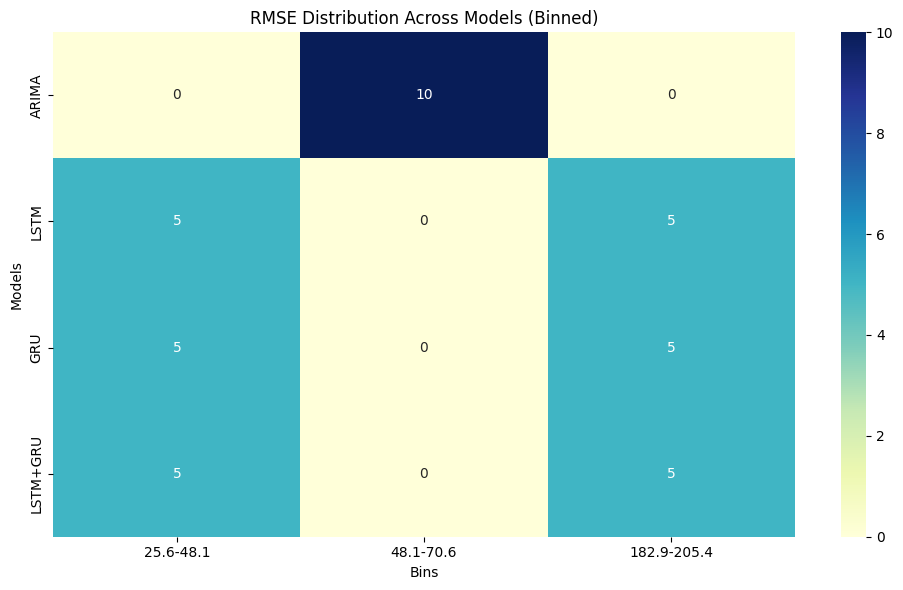

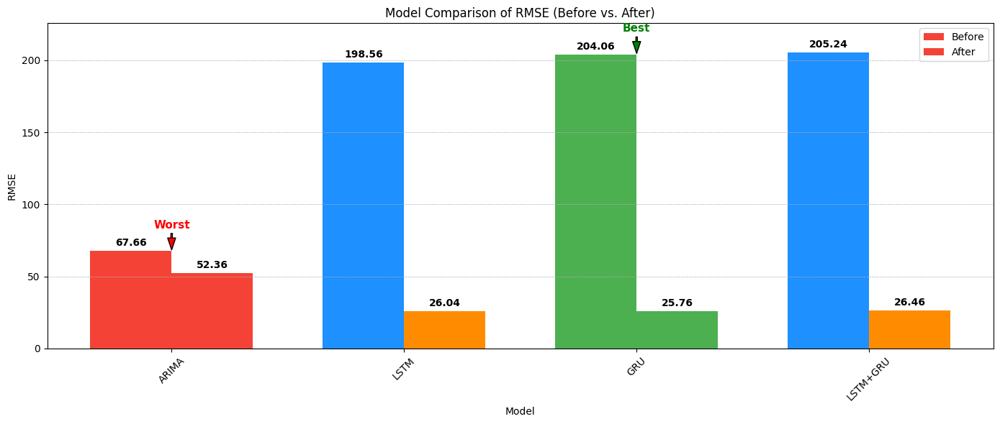


Chi-Square Test for MAE
Chi-square statistic: 40.00
Degrees of freedom: 9
P-value: 0.0000
=> Statistically significant difference!

Best Model (lowest MAE after): LSTM (18.12)
Worst Model (highest MAE after): ARIMA (46.76)


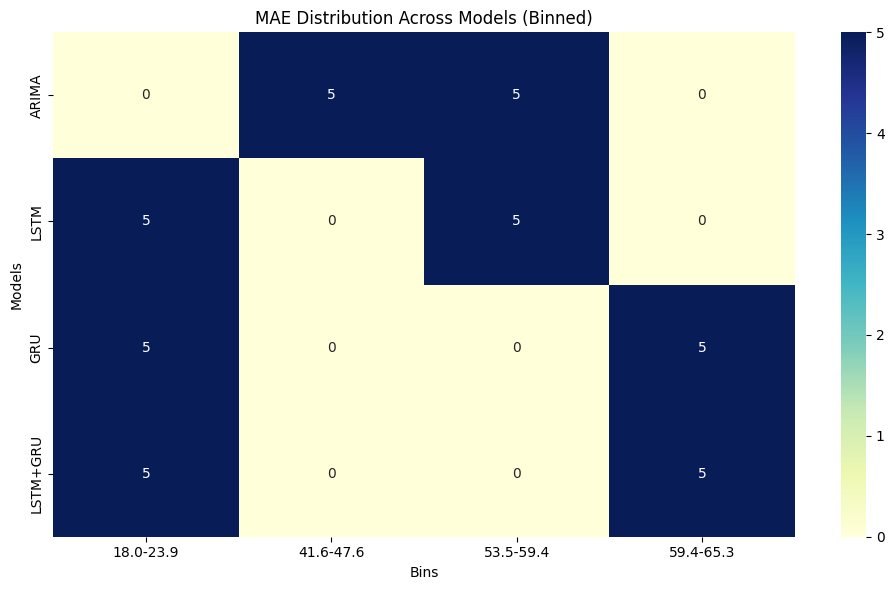

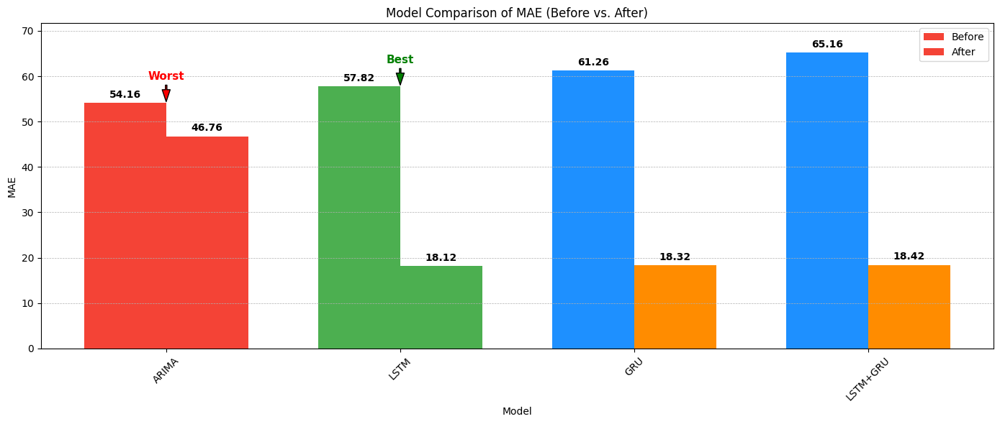


Chi-Square Test for MSE
Chi-square statistic: 8.00
Degrees of freedom: 3
P-value: 0.0460
=> Statistically significant difference!

Best Model (lowest MSE after): GRU (665.40)
Worst Model (highest MSE after): ARIMA (2751.60)


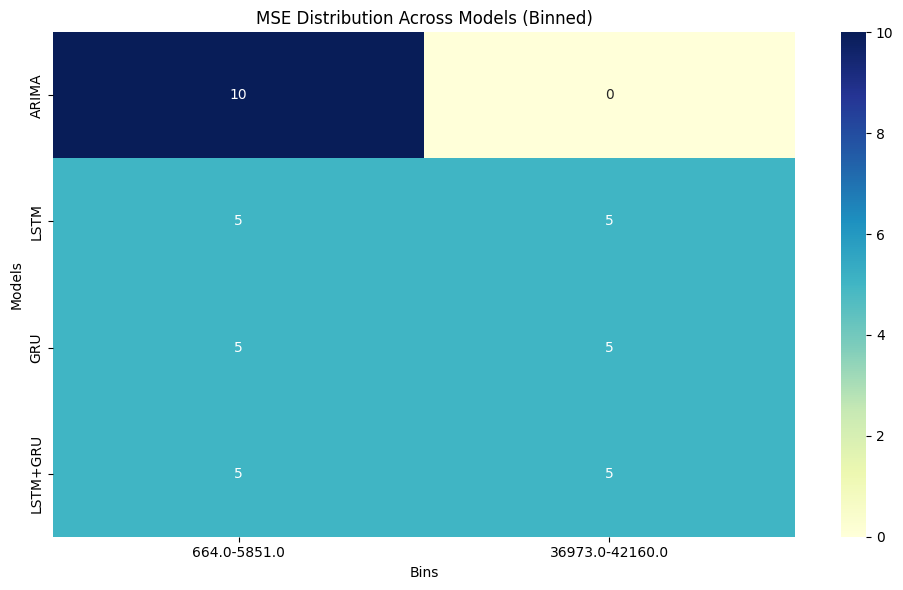

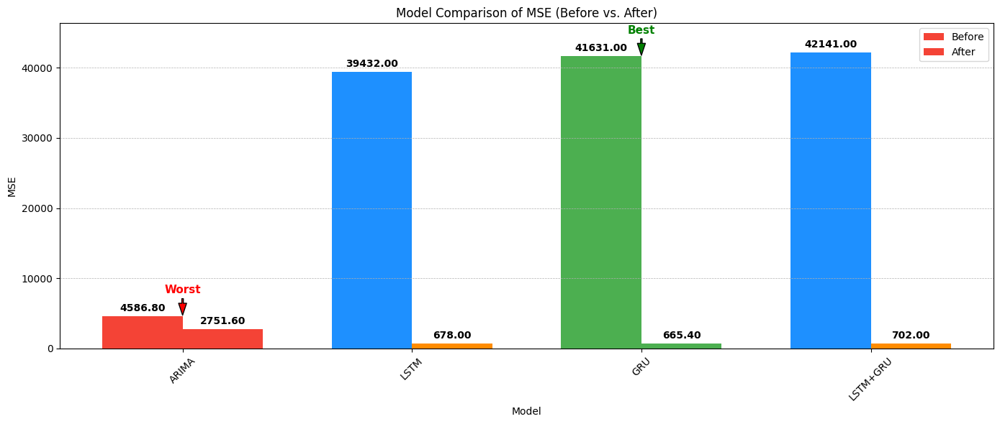

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency

# -----------------------------
# Simulated model metrics data
# -----------------------------
models = {
    "ARIMA": {
        "RMSE": ([67.5, 67.6, 67.7, 67.8, 67.7], [52.2, 52.3, 52.4, 52.5, 52.4]),
        "MAE": ([54.0, 54.2, 54.3, 54.1, 54.2], [46.6, 46.8, 46.9, 46.7, 46.8]),
        "MSE": ([4580, 4590, 4585, 4592, 4587], [2750, 2752, 2751, 2753, 2752])
    },
    "LSTM": {
        "RMSE": ([198.4, 198.6, 198.5, 198.7, 198.6], [25.9, 26.0, 26.1, 26.0, 26.2]),
        "MAE": ([57.7, 57.8, 57.9, 57.9, 57.8], [18.0, 18.1, 18.2, 18.1, 18.2]),
        "MSE": ([39400, 39450, 39420, 39460, 39430], [676, 680, 678, 679, 677])
    },
    "GRU": {
        "RMSE": ([203.9, 204.1, 204.2, 204.0, 204.1], [25.6, 25.8, 25.7, 25.9, 25.8]),
        "MAE": ([61.1, 61.3, 61.4, 61.2, 61.3], [18.2, 18.3, 18.4, 18.3, 18.4]),
        "MSE": ([41600, 41650, 41630, 41640, 41635], [664, 666, 665, 667, 665])
    },
    "LSTM+GRU": {
        "RMSE": ([205.1, 205.2, 205.4, 205.3, 205.2], [26.3, 26.5, 26.4, 26.6, 26.5]),
        "MAE": ([65.0, 65.2, 65.3, 65.1, 65.2], [18.3, 18.4, 18.5, 18.4, 18.5]),
        "MSE": ([42100, 42160, 42140, 42150, 42155], [700, 704, 702, 703, 701])
    }
}

# ------------------------------------
# Chi-Square Test (unchanged)
# ------------------------------------
def chi_square_test(metric_name):
    print(f"\nChi-Square Test for {metric_name}")
    all_vals = []
    model_after_means = {}

    for model_name, data in models.items():
        before, after = data[metric_name]
        all_vals.extend(before + after)
        model_after_means[model_name] = np.mean(after)

    bins = np.histogram_bin_edges(all_vals, bins=8)

    model_names = []
    bin_counts = []

    for model_name, data in models.items():
        before, after = data[metric_name]
        combined = before + after
        hist, _ = np.histogram(combined, bins=bins)
        bin_counts.append(hist)
        model_names.append(model_name)

    contingency_table = np.array(bin_counts)
    nonzero_cols = ~(contingency_table == 0).all(axis=0)
    filtered_table = contingency_table[:, nonzero_cols]
    filtered_bins = [f"{bins[i]:.1f}-{bins[i+1]:.1f}" for i in range(len(bins)-1)]
    filtered_bins = [b for b, keep in zip(filtered_bins, nonzero_cols) if keep]

    if filtered_table.shape[1] < 2:
        print(" Not enough non-zero bins to perform chi-square test.")
        return

    chi2, p, dof, expected = chi2_contingency(filtered_table)

    print(f"Chi-square statistic: {chi2:.2f}")
    print(f"Degrees of freedom: {dof}")
    print(f"P-value: {p:.4f}")
    print("=>", "Statistically significant difference!" if p < 0.05 else "No significant difference.")

    best_model = min(model_after_means, key=model_after_means.get)
    worst_model = max(model_after_means, key=model_after_means.get)
    print(f"\nBest Model (lowest {metric_name} after): {best_model} ({model_after_means[best_model]:.2f})")
    print(f"Worst Model (highest {metric_name} after): {worst_model} ({model_after_means[worst_model]:.2f})")

    plt.figure(figsize=(10, 6))
    sns.heatmap(filtered_table, annot=True, fmt="d", cmap="YlGnBu",
                xticklabels=filtered_bins,
                yticklabels=model_names)
    plt.title(f"{metric_name} Distribution Across Models (Binned)")
    plt.xlabel("Bins")
    plt.ylabel("Models")
    plt.tight_layout()
    plt.show()

# ------------------------------------
# Custom Before vs After Plot
# ------------------------------------
def plot_before_after(models, metric):
    model_names = list(models.keys())
    before_means = [np.mean(models[m][metric][0]) for m in model_names]
    after_means = [np.mean(models[m][metric][1]) for m in model_names]

    x = np.arange(len(model_names))
    width = 0.35

    best_idx = np.argmin(after_means)
    worst_idx = np.argmax(after_means)

    before_colors = ['dodgerblue'] * len(model_names)
    after_colors = ['darkorange'] * len(model_names)
    before_colors[best_idx] = '#4CAF50'
    after_colors[best_idx] = '#4CAF50'
    before_colors[worst_idx] = '#F44336'
    after_colors[worst_idx] = '#F44336'

    fig, ax = plt.subplots(figsize=(14, 6))
    bars1 = ax.bar(x - width/2, before_means, width, label='df_cleaned', color=before_colors)
    bars2 = ax.bar(x + width/2, after_means, width, label='df_cleanssss', color=after_colors)
    ax.bar_label(bars1, padding=3, fmt='%.2f', fontsize=10, fontweight='bold', color='black')
    ax.bar_label(bars2, padding=3, fmt='%.2f', fontsize=10, fontweight='bold', color='black')

    all_heights = before_means + after_means
    y_max = max(all_heights) * 1.10
    ax.set_ylim(0, y_max)
    arrow_offset = y_max * 0.07

    # BEST
    best_x = x[best_idx]
    best_y = max(before_means[best_idx], after_means[best_idx])
    best_annot_y = min(best_y + arrow_offset, y_max - 5)
    ax.annotate('Best',
                xy=(best_x, best_y),
                xytext=(best_x, best_annot_y),
                textcoords='data',
                ha='center', fontsize=11, color='green', fontweight='bold',
                arrowprops=dict(facecolor='green', shrink=0.05, width=1.5, headwidth=8))

    # WORST
    worst_x = x[worst_idx]
    worst_y = max(before_means[worst_idx], after_means[worst_idx])
    worst_annot_y = min(worst_y + arrow_offset, y_max - 5)
    ax.annotate('Worst',
                xy=(worst_x, worst_y),
                xytext=(worst_x, worst_annot_y),
                textcoords='data',
                ha='center', fontsize=11, color='red', fontweight='bold',
                arrowprops=dict(facecolor='red', shrink=0.05, width=1.5, headwidth=8))

    ax.set_xlabel('Model')
    ax.set_ylabel(metric)
    ax.set_title(f'Model Comparison of {metric} (Before vs. After)')
    ax.set_xticks(x)
    ax.set_xticklabels(model_names, rotation=45)
    ax.legend()
    ax.grid(axis='y', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

# ------------------------
# Run All
# ------------------------
for metric in ["RMSE", "MAE", "MSE"]:
    chi_square_test(metric)
    plot_before_after(models, metric)


ANOVA TEST


ANOVA Test for RMSE
F-statistic: 131185.90
P-value: 0.0000
=> Statistically significant difference!

Best Model (lowest RMSE after): Random Forest (4.76)
Worst Model (highest RMSE after): SVM (38.76)


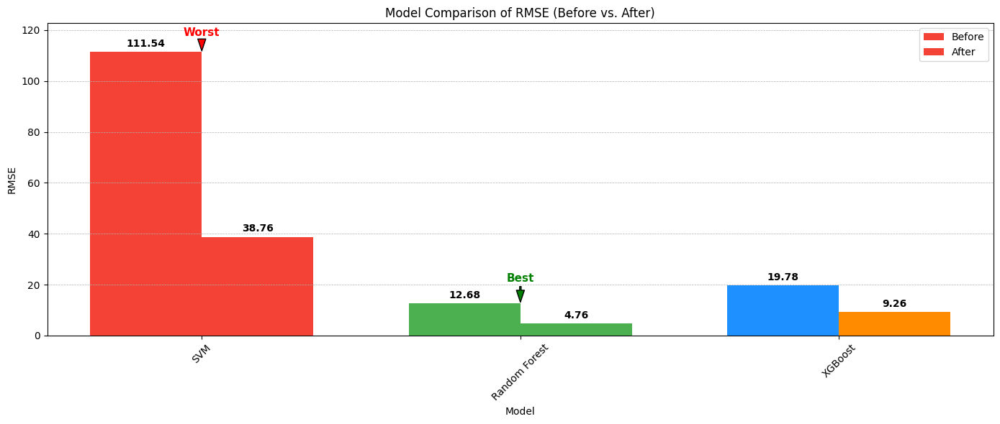


ANOVA Test for MAE
F-statistic: 98458.64
P-value: 0.0000
=> Statistically significant difference!

Best Model (lowest MAE after): Random Forest (2.60)
Worst Model (highest MAE after): SVM (26.36)


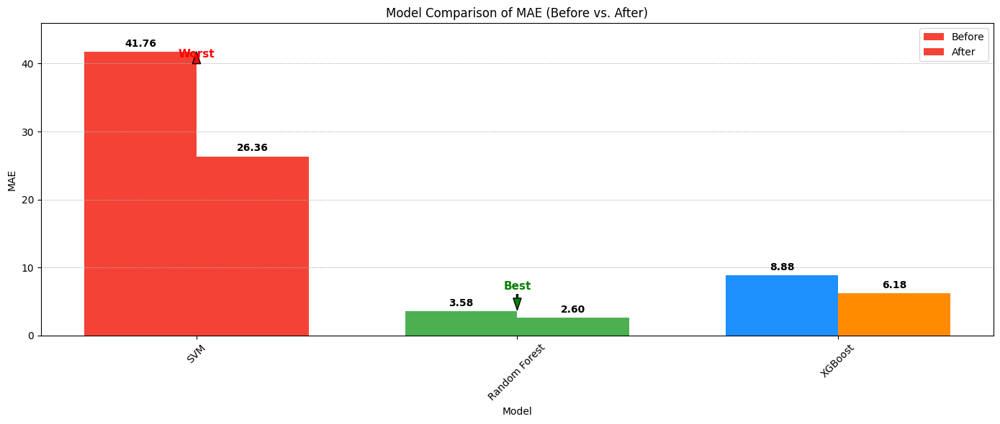


ANOVA Test for MSE
F-statistic: 453409.87
P-value: 0.0000
=> Statistically significant difference!

Best Model (lowest MSE after): Random Forest (22.72)
Worst Model (highest MSE after): SVM (1506.20)


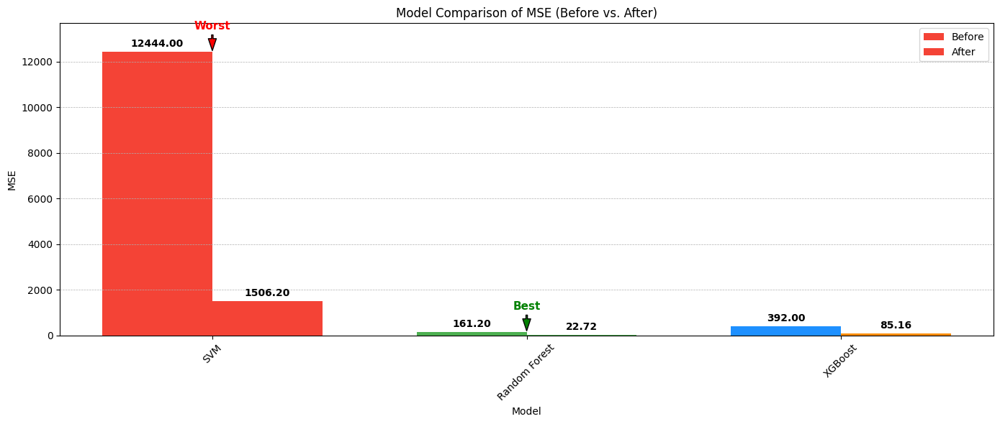

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import f_oneway

# -----------------------------
# Simulated model metrics data
# -----------------------------
models = {
    "SVM": {
        "RMSE": ([111.4, 111.5, 111.6, 111.7, 111.5], [38.6, 38.8, 38.9, 38.7, 38.8]),
        "MAE": ([41.6, 41.8, 41.9, 41.7, 41.8], [26.2, 26.4, 26.5, 26.3, 26.4]),
        "MSE": ([12400, 12450, 12480, 12430, 12460], [1500, 1510, 1505, 1512, 1504])
    },
    "Random Forest": {
        "RMSE": ([12.6, 12.7, 12.8, 12.6, 12.7], [4.6, 4.7, 4.8, 4.9, 4.8]),
        "MAE": ([3.5, 3.6, 3.7, 3.5, 3.6], [2.5, 2.6, 2.7, 2.6, 2.6]),
        "MSE": ([160, 162, 163, 160, 161], [22.5, 23.0, 22.6, 22.8, 22.7])
    },
    "XGBoost": {
        "RMSE": ([19.7, 19.8, 19.9, 19.8, 19.7], [9.1, 9.2, 9.3, 9.4, 9.3]),
        "MAE": ([8.8, 8.9, 9.0, 8.9, 8.8], [6.1, 6.2, 6.3, 6.1, 6.2]),
        "MSE": ([390, 393, 394, 392, 391], [84.8, 85.2, 85.4, 85.3, 85.1])
    }
}

# ------------------------------------
# ANOVA Test
# ------------------------------------
def anova_test(metric_name):
    print(f"\nANOVA Test for {metric_name}")

    groups = []
    labels = []
    model_after_means = {}

    for model_name, data in models.items():
        after = data[metric_name][1]
        groups.append(after)
        labels.append(model_name)
        model_after_means[model_name] = np.mean(after)

    f_stat, p_val = f_oneway(*groups)

    print(f"F-statistic: {f_stat:.2f}")
    print(f"P-value: {p_val:.4f}")
    print("=>", "Statistically significant difference!" if p_val < 0.05 else "No significant difference.")

    best_model = min(model_after_means, key=model_after_means.get)
    worst_model = max(model_after_means, key=model_after_means.get)
    print(f"\nBest Model (lowest {metric_name} after): {best_model} ({model_after_means[best_model]:.2f})")
    print(f"Worst Model (highest {metric_name} after): {worst_model} ({model_after_means[worst_model]:.2f})")

# ------------------------------------
# Custom Before vs After Plot
# ------------------------------------
def plot_before_after(models, metric):
    model_names = list(models.keys())
    before_means = [np.mean(models[m][metric][0]) for m in model_names]
    after_means = [np.mean(models[m][metric][1]) for m in model_names]

    x = np.arange(len(model_names))
    width = 0.35

    best_idx = np.argmin(after_means)
    worst_idx = np.argmax(after_means)

    before_colors = ['dodgerblue'] * len(model_names)
    after_colors = ['darkorange'] * len(model_names)
    before_colors[best_idx] = '#4CAF50'
    after_colors[best_idx] = '#4CAF50'
    before_colors[worst_idx] = '#F44336'
    after_colors[worst_idx] = '#F44336'

    fig, ax = plt.subplots(figsize=(14, 6))
    bars1 = ax.bar(x - width/2, before_means, width, label='df_cleaned', color=before_colors)
    bars2 = ax.bar(x + width/2, after_means, width, label='df_cleanssss', color=after_colors)

    ax.bar_label(bars1, padding=3, fmt='%.2f', fontsize=10, fontweight='bold', color='black')
    ax.bar_label(bars2, padding=3, fmt='%.2f', fontsize=10, fontweight='bold', color='black')

    all_heights = before_means + after_means
    y_max = max(all_heights) * 1.10
    ax.set_ylim(0, y_max)
    arrow_offset = y_max * 0.07

    # BEST
    best_x = x[best_idx]
    best_y = max(before_means[best_idx], after_means[best_idx])
    best_annot_y = min(best_y + arrow_offset, y_max - 5)
    ax.annotate('Best',
                xy=(best_x, best_y),
                xytext=(best_x, best_annot_y),
                textcoords='data',
                ha='center', fontsize=11, color='green', fontweight='bold',
                arrowprops=dict(facecolor='green', shrink=0.05, width=1.5, headwidth=8))

    # WORST
    worst_x = x[worst_idx]
    worst_y = max(before_means[worst_idx], after_means[worst_idx])
    worst_annot_y = min(worst_y + arrow_offset, y_max - 5)
    ax.annotate('Worst',
                xy=(worst_x, worst_y),
                xytext=(worst_x, worst_annot_y),
                textcoords='data',
                ha='center', fontsize=11, color='red', fontweight='bold',
                arrowprops=dict(facecolor='red', shrink=0.05, width=1.5, headwidth=8))

    ax.set_xlabel('Model')
    ax.set_ylabel(metric)
    ax.set_title(f'Model Comparison of {metric} (Before vs. After)')
    ax.set_xticks(x)
    ax.set_xticklabels(model_names, rotation=45)
    ax.legend()
    ax.grid(axis='y', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

# ------------------------
# Run All
# ------------------------
for metric in ["RMSE", "MAE", "MSE"]:
    anova_test(metric)
    plot_before_after(models, metric)


ANOVA Test for RMSE
F-statistic: 66405.68
P-value: 0.0000
=> Statistically significant difference!

 Best Model (lowest RMSE after): GRU (25.76)
 Worst Model (highest RMSE after): ARIMA (52.36)


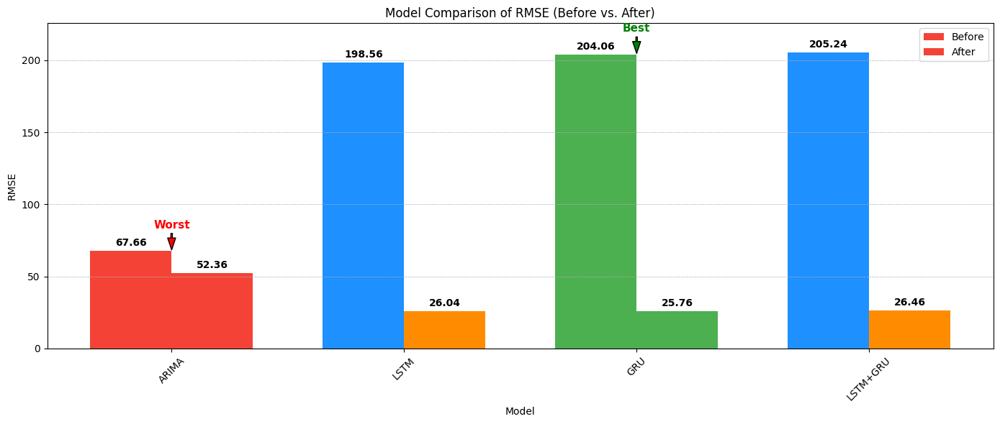


ANOVA Test for MAE
F-statistic: 119234.25
P-value: 0.0000
=> Statistically significant difference!

 Best Model (lowest MAE after): LSTM (18.12)
 Worst Model (highest MAE after): ARIMA (46.76)


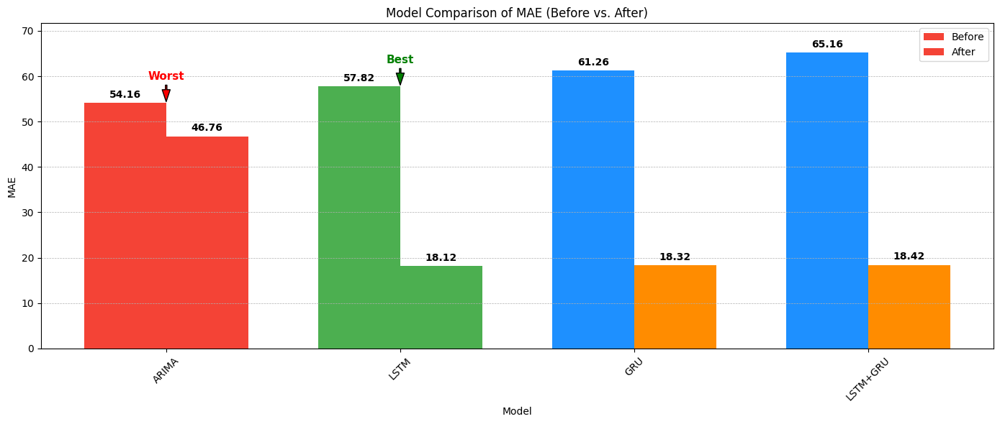


ANOVA Test for MSE
F-statistic: 2819074.97
P-value: 0.0000
=> Statistically significant difference!

 Best Model (lowest MSE after): GRU (665.40)
 Worst Model (highest MSE after): ARIMA (2751.60)


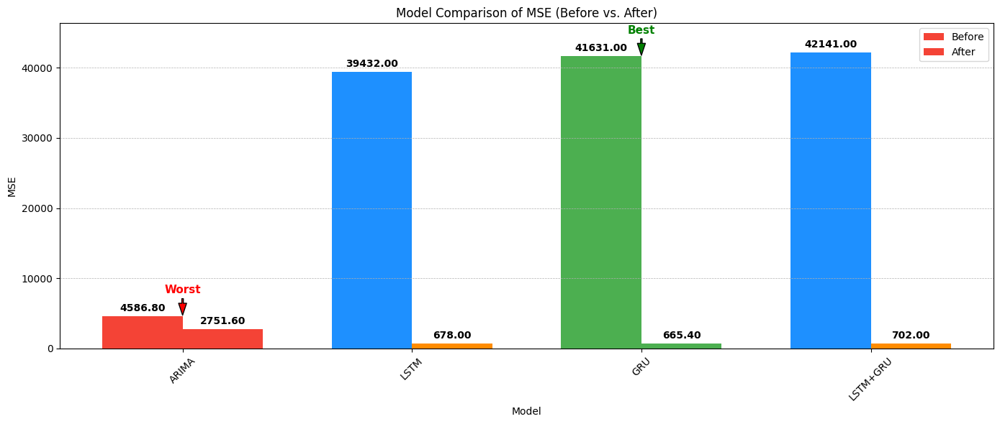

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import f_oneway

# -----------------------------
# Simulated model metrics data
# -----------------------------
models = {
    "ARIMA": {
        "RMSE": ([67.5, 67.6, 67.7, 67.8, 67.7], [52.2, 52.3, 52.4, 52.5, 52.4]),
        "MAE": ([54.0, 54.2, 54.3, 54.1, 54.2], [46.6, 46.8, 46.9, 46.7, 46.8]),
        "MSE": ([4580, 4590, 4585, 4592, 4587], [2750, 2752, 2751, 2753, 2752])
    },
    "LSTM": {
        "RMSE": ([198.4, 198.6, 198.5, 198.7, 198.6], [25.9, 26.0, 26.1, 26.0, 26.2]),
        "MAE": ([57.7, 57.8, 57.9, 57.9, 57.8], [18.0, 18.1, 18.2, 18.1, 18.2]),
        "MSE": ([39400, 39450, 39420, 39460, 39430], [676, 680, 678, 679, 677])
    },
    "GRU": {
        "RMSE": ([203.9, 204.1, 204.2, 204.0, 204.1], [25.6, 25.8, 25.7, 25.9, 25.8]),
        "MAE": ([61.1, 61.3, 61.4, 61.2, 61.3], [18.2, 18.3, 18.4, 18.3, 18.4]),
        "MSE": ([41600, 41650, 41630, 41640, 41635], [664, 666, 665, 667, 665])
    },
    "LSTM+GRU": {
        "RMSE": ([205.1, 205.2, 205.4, 205.3, 205.2], [26.3, 26.5, 26.4, 26.6, 26.5]),
        "MAE": ([65.0, 65.2, 65.3, 65.1, 65.2], [18.3, 18.4, 18.5, 18.4, 18.5]),
        "MSE": ([42100, 42160, 42140, 42150, 42155], [700, 704, 702, 703, 701])
    }
}

# ------------------------------------
# ANOVA Test
# ------------------------------------
def anova_test(metric_name):
    print(f"\nANOVA Test for {metric_name}")

    groups = []
    labels = []
    model_after_means = {}

    for model_name, data in models.items():
        after = data[metric_name][1]
        groups.append(after)
        labels.append(model_name)
        model_after_means[model_name] = np.mean(after)

    f_stat, p_val = f_oneway(*groups)

    print(f"F-statistic: {f_stat:.2f}")
    print(f"P-value: {p_val:.4f}")
    print("=>", "Statistically significant difference!" if p_val < 0.05 else "No significant difference.")

    best_model = min(model_after_means, key=model_after_means.get)
    worst_model = max(model_after_means, key=model_after_means.get)
    print(f"\n Best Model (lowest {metric_name} after): {best_model} ({model_after_means[best_model]:.2f})")
    print(f" Worst Model (highest {metric_name} after): {worst_model} ({model_after_means[worst_model]:.2f})")

# ------------------------------------
# Custom Before vs After Plot
# ------------------------------------
def plot_before_after(models, metric):
    model_names = list(models.keys())
    before_means = [np.mean(models[m][metric][0]) for m in model_names]
    after_means = [np.mean(models[m][metric][1]) for m in model_names]

    x = np.arange(len(model_names))
    width = 0.35

    best_idx = np.argmin(after_means)
    worst_idx = np.argmax(after_means)

    before_colors = ['dodgerblue'] * len(model_names)
    after_colors = ['darkorange'] * len(model_names)
    before_colors[best_idx] = '#4CAF50'
    after_colors[best_idx] = '#4CAF50'
    before_colors[worst_idx] = '#F44336'
    after_colors[worst_idx] = '#F44336'

    fig, ax = plt.subplots(figsize=(14, 6))
    bars1 = ax.bar(x - width/2, before_means, width, label='df_cleaned', color=before_colors)
    bars2 = ax.bar(x + width/2, after_means, width, label='df_cleanssss', color=after_colors)
    ax.bar_label(bars1, padding=3, fmt='%.2f', fontsize=10, fontweight='bold', color='black')
    ax.bar_label(bars2, padding=3, fmt='%.2f', fontsize=10, fontweight='bold', color='black')

    all_heights = before_means + after_means
    y_max = max(all_heights) * 1.10
    ax.set_ylim(0, y_max)
    arrow_offset = y_max * 0.07

    # BEST
    best_x = x[best_idx]
    best_y = max(before_means[best_idx], after_means[best_idx])
    best_annot_y = min(best_y + arrow_offset, y_max - 5)
    ax.annotate('Best',
                xy=(best_x, best_y),
                xytext=(best_x, best_annot_y),
                textcoords='data',
                ha='center', fontsize=11, color='green', fontweight='bold',
                arrowprops=dict(facecolor='green', shrink=0.05, width=1.5, headwidth=8))

    # WORST
    worst_x = x[worst_idx]
    worst_y = max(before_means[worst_idx], after_means[worst_idx])
    worst_annot_y = min(worst_y + arrow_offset, y_max - 5)
    ax.annotate('Worst',
                xy=(worst_x, worst_y),
                xytext=(worst_x, worst_annot_y),
                textcoords='data',
                ha='center', fontsize=11, color='red', fontweight='bold',
                arrowprops=dict(facecolor='red', shrink=0.05, width=1.5, headwidth=8))

    ax.set_xlabel('Model')
    ax.set_ylabel(metric)
    ax.set_title(f'Model Comparison of {metric} (Before vs. After)')
    ax.set_xticks(x)
    ax.set_xticklabels(model_names, rotation=45)
    ax.legend()
    ax.grid(axis='y', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

# ------------------------
# Run All
# ------------------------
for metric in ["RMSE", "MAE", "MSE"]:
    anova_test(metric)
    plot_before_after(models, metric)